[PIPELINE] Folha alvo: SB21_ZA_II2_NE
[ASTER] Folha 'SB21_ZA_II2_NE' carregada. Área WGS84 (aprox): 0.015625 (graus²)
[ASTER] Buscando itens em 'aster-l1t'...
[ASTER] Total de itens retornados (antes de filtros locais): 46

[ASTER] Itens candidatos (ordenados):
  id=AST_L1T_00307292004141220_20150505110335, datetime=2004-07-29T14:12:20.641000+00:00, delta_days=1447, coverage=100.00%, cloud=0.00%
  id=AST_L1T_00308012005141202_20150510135953, datetime=2005-08-01T14:12:02.298000+00:00, delta_days=1079, coverage=100.00%, cloud=1.00%

[ASTER] Melhor item:
  id=AST_L1T_00307292004141220_20150505110335
  datetime=2004-07-29T14:12:20.641000+00:00
  delta_days=1447
  coverage=100.00%
  cloud=0.00%

[PIPELINE] Data de referência para S2 = data da ASTER selecionada: 2004-07-29T14:12:20.641000+00:00
[S2] Folha 'SB21_ZA_II2_NE' carregada. Área WGS84 (aprox): 0.015625 (graus²)
[S2] Buscando itens em 'sentinel-2-l2a'...
[S2] Total de itens retornados (antes de filtros locais): 200
[S2] S2B_MSIL2A_20

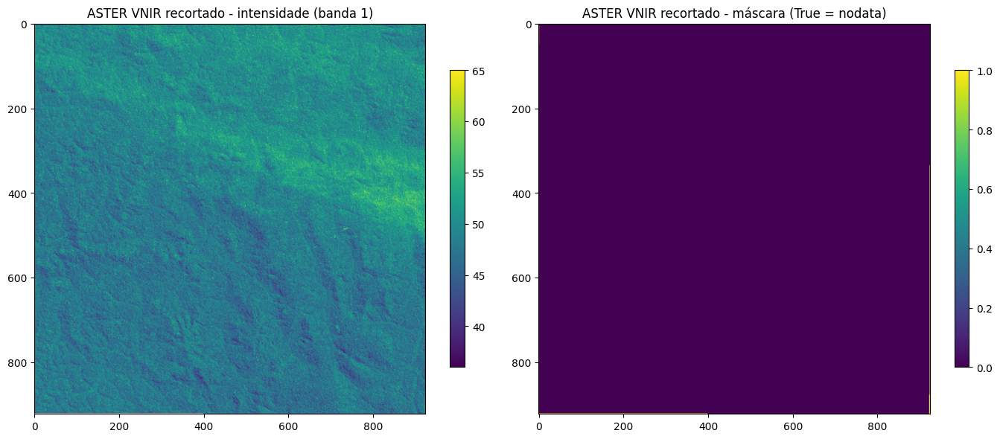


[INSPECT S2]
  S2 id: S2B_MSIL2A_20240607T140709_R110_T21MWP_20240607T180925
  cloud_cover (metadado): 0.000265 %
  Assets S2 disponíveis: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP', 'visual', 'safe-manifest', 'granule-metadata', 'inspire-metadata', 'product-metadata', 'datastrip-metadata', 'tilejson', 'rendered_preview']
  Lendo asset 'visual' e recortando para a folha...
  Fração de nodata no visual recortado: 0.0021


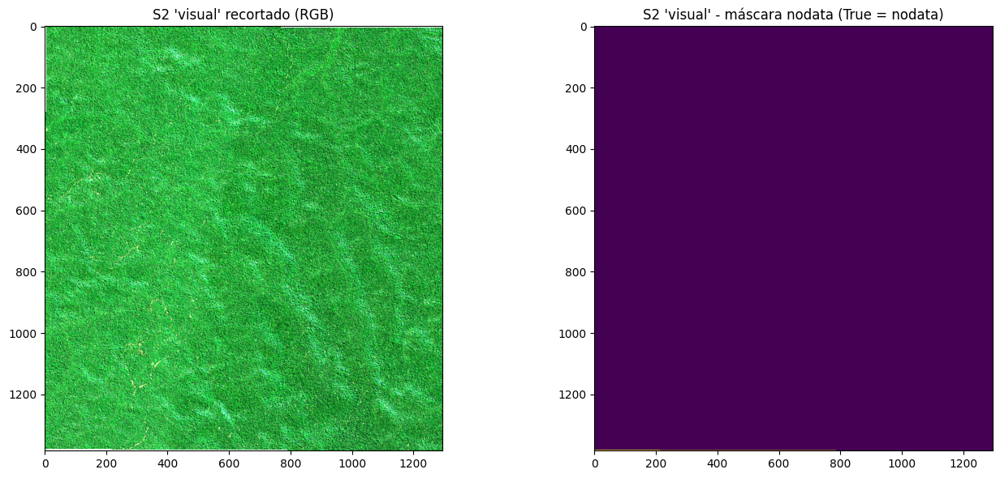

  Lendo asset 'SCL' e recortando para a folha...
  Fração de nodata no SCL recortado   : 0.0021
  Fração de nuvem/sombra/neve (SCL)   : 0.0000


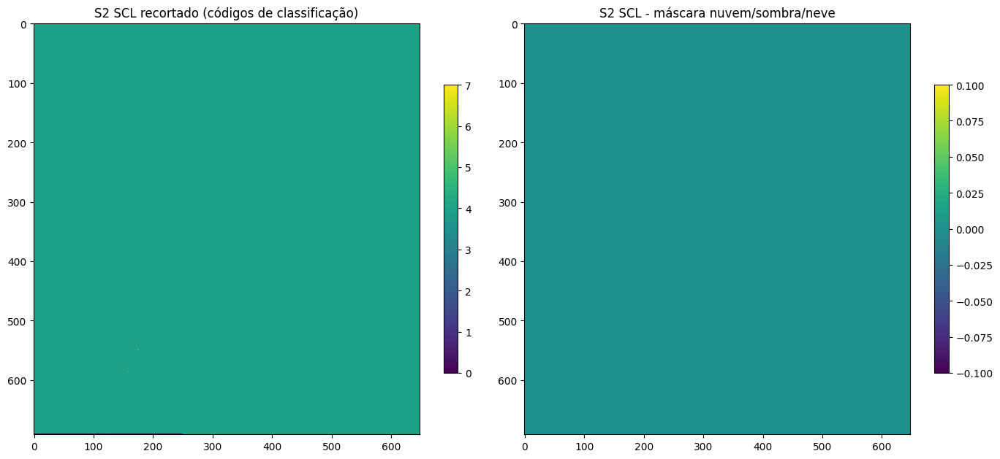

In [1]:
#!/usr/bin/env python
from __future__ import annotations

import json
from datetime import datetime, timezone
from typing import Dict, Any, List, Optional, Tuple

import numpy as np
import matplotlib.pyplot as plt

import rioxarray
from sqlalchemy import create_engine, text
from shapely.geometry import shape
from shapely.ops import transform as shp_transform
from pyproj import Transformer
from pystac_client import Client
import planetary_computer

# ----------------------------------------------------------------------
# CONFIGURAÇÕES GERAIS
# ----------------------------------------------------------------------
PC_STAC_URL = "https://planetarycomputer.microsoft.com/api/stac/v1"

PG_USER = "postgres"
PG_PASS = "postgres"
PG_HOST = "localhost"
PG_PORT = "5432"
PG_DB   = "geologia"

PG_CONN_STR = (
    f"postgresql+psycopg2://{PG_USER}:{PG_PASS}@{PG_HOST}:{PG_PORT}/{PG_DB}"
)

# Folha e data alvo (aerogeofísica)
FOLHA_CODIGO = "SB21_ZA_II2_NE"
ASTER_TARGET_DATE_STR = "2008-07-15"  # data alvo aerogeofísica


# ----------------------------------------------------------------------
# UTILITÁRIOS GERAIS
# ----------------------------------------------------------------------
def parse_target_date(date_str: str) -> datetime:
    dt = datetime.strptime(date_str, "%Y-%m-%d")
    return dt.replace(tzinfo=timezone.utc)


def item_datetime(item) -> datetime:
    """
    Extrai datetime (timezone-aware) de um pystac.Item.
    """
    if getattr(item, "datetime", None) is not None:
        dt = item.datetime
        if dt.tzinfo is None:
            dt = dt.replace(tzinfo=timezone.utc)
        return dt

    props = getattr(item, "properties", {}) or {}
    dt_str = props.get("datetime") or props.get("start_datetime")
    if dt_str is None:
        raise RuntimeError(f"Item {getattr(item, 'id', '?')} sem campo datetime.")

    if dt_str.endswith("Z"):
        dt_str = dt_str.replace("Z", "+00:00")
    dt = datetime.fromisoformat(dt_str)
    if dt.tzinfo is None:
        dt = dt.replace(tzinfo=timezone.utc)
    return dt


def get_cloud_cover(item) -> Optional[float]:
    props = getattr(item, "properties", {}) or {}
    for key in ("eo:cloud_cover", "s2:cloud_cover"):
        if key in props and props[key] is not None:
            try:
                return float(props[key])
            except Exception:
                continue
    return None


def get_pc_client() -> Client:
    """
    Client do Planetary Computer com assets já assinados (SAS).
    """
    return Client.open(
        PC_STAC_URL,
        modifier=planetary_computer.sign_inplace,
    )


# ----------------------------------------------------------------------
# POSTGIS / GEOMETRIA DA FOLHA
# ----------------------------------------------------------------------
def get_folha_geom_geojson(
    codigo_folha: str,
    conn_str: str = PG_CONN_STR,
    schema: str = "carto",
    table: str = "folhas_cartograficas",
) -> Dict[str, Any]:
    """
    Retorna a geometria da folha em WGS84 (EPSG:4326) como dict GeoJSON.
    """
    engine = create_engine(conn_str)
    sql = text(
        f"""
        SELECT ST_AsGeoJSON(ST_Transform(geom, 4326)) AS geom_json
        FROM {schema}.{table}
        WHERE codigo = :codigo
        LIMIT 1;
        """
    )
    with engine.begin() as conn:
        row = conn.execute(sql, {"codigo": codigo_folha}).fetchone()

    if row is None or row.geom_json is None:
        raise RuntimeError(f"Não foi encontrada geometria para a folha '{codigo_folha}'")

    return json.loads(row.geom_json)


# ----------------------------------------------------------------------
# GEOMETRIA / COBERTURA (ASTER / S2)
# ----------------------------------------------------------------------
def build_local_equal_area_transformer(geom_geojson: Dict[str, Any]) -> Transformer:
    geom = shape(geom_geojson)
    lon0, lat0 = geom.centroid.x, geom.centroid.y
    laea_proj = (
        f"+proj=laea +lat_0={lat0} +lon_0={lon0} "
        "+datum=WGS84 +units=m +no_defs"
    )
    return Transformer.from_crs("EPSG:4326", laea_proj, always_xy=True)


def coverage_fraction(
    folha_geom_geojson: Dict[str, Any],
    item_geom_geojson: Dict[str, Any],
    transformer: Transformer,
) -> float:
    folha_geom = shape(folha_geom_geojson)
    item_geom = shape(item_geom_geojson)

    project = transformer.transform
    folha_proj = shp_transform(project, folha_geom)
    item_proj = shp_transform(project, item_geom)

    inter = folha_proj.intersection(item_proj)
    if folha_proj.is_empty or inter.is_empty:
        return 0.0
    return inter.area / folha_proj.area


# ----------------------------------------------------------------------
# CLIP RASTER E MÉTRICAS (NODATA / SCL)
# ----------------------------------------------------------------------
def clip_raster_to_folha(href: str, folha_geom_geojson: dict):
    """
    Abre o raster indicado por href e recorta para a geometria da folha (EPSG:4326).
    """
    da = rioxarray.open_rasterio(href, masked=True)
    da_clip = da.rio.clip([folha_geom_geojson], crs="EPSG:4326", drop=True)
    return da_clip


def compute_nodata_fraction(da_clip):
    """
    Fração de pixels nodata no recorte.
    Se houver várias bandas, nodata = todas as bandas NaN.
    """
    arr = da_clip.values
    if arr.ndim == 3:
        nodata_mask = np.all(np.isnan(arr), axis=0)
    else:
        nodata_mask = np.isnan(arr)
    frac = nodata_mask.sum() / nodata_mask.size
    return frac, nodata_mask


def compute_scl_cloud_fraction(da_scl_clip):
    """
    A partir de um SCL recortado, calcula:
      - fração de nodata (código 0)
      - fração de nuvem/sombra/neve (códigos {3,8,9,10,11})
    Trate NaN como nodata (0) para evitar warnings.
    """
    scl = da_scl_clip.values
    if scl.ndim == 3:
        scl = scl[0, :, :]

    # NaN -> 0 (nodata), depois cast para int16 sem warning relevante
    scl = np.where(np.isnan(scl), 0, scl).astype("int16")

    total = scl.size
    nodata_frac = np.sum(scl == 0) / total
    cloud_mask = np.isin(scl, [3, 8, 9, 10, 11])
    cloud_frac = np.sum(cloud_mask) / total

    return nodata_frac, cloud_frac, scl, cloud_mask


# ----------------------------------------------------------------------
# ASTER: BUSCA CENA COM POUCA NUVEM E BOA COBERTURA
# ----------------------------------------------------------------------
def search_aster_cloudfree_for_folha(
    codigo_folha: str,
    aster_target_date_str: str = ASTER_TARGET_DATE_STR,
    collection_id: str = "aster-l1t",
    search_datetime: str = "2000-01-01/2015-12-31",
    min_coverage: float = 0.99,
    max_cloud: float = 1.0,
    max_items: int = 2000,
) -> Tuple[Optional[Dict[str, Any]], List[Dict[str, Any]]]:
    """
    Busca cenas ASTER L1T com:
      - cobertura >= min_coverage
      - cloud_cover <= max_cloud
      - proximidade da data alvo.
    Ordena por:
      1) cloud_cover crescente
      2) |data - data_alvo| crescente
      3) cobertura decrescente
    """
    folha_geom = get_folha_geom_geojson(codigo_folha)
    folha_shape = shape(folha_geom)
    print(
        f"[ASTER] Folha '{codigo_folha}' carregada. "
        f"Área WGS84 (aprox): {folha_shape.area:.6f} (graus²)"
    )

    transformer = build_local_equal_area_transformer(folha_geom)
    client = get_pc_client()

    print(f"[ASTER] Buscando itens em '{collection_id}'...")
    search = client.search(
        collections=[collection_id],
        intersects=folha_geom,
        datetime=search_datetime,
        max_items=max_items,
    )
    items = list(search.items())
    print(f"[ASTER] Total de itens retornados (antes de filtros locais): {len(items)}")

    if not items:
        print("[ASTER] Nenhum item retornado pelo STAC.")
        return None, []

    target_date = parse_target_date(aster_target_date_str).date()
    candidates: List[Dict[str, Any]] = []

    for item in items:
        dt = item_datetime(item)
        dt_date = dt.date()
        delta_days = abs((dt_date - target_date).days)

        cloud = get_cloud_cover(item)
        if cloud is None:
            continue
        if cloud > max_cloud:
            continue

        frac = coverage_fraction(
            folha_geom_geojson=folha_geom,
            item_geom_geojson=item.geometry,
            transformer=transformer,
        )
        if frac < min_coverage:
            continue

        candidates.append(
            {
                "id": item.id,
                "datetime": dt.isoformat(),
                "delta_days": delta_days,
                "coverage_fraction": frac,
                "coverage_percent": frac * 100.0,
                "cloud_cover": cloud,
                "item": item,
            }
        )

    if not candidates:
        print(
            "[ASTER] Nenhum item atendeu a:\n"
            f"  coverage >= {min_coverage*100:.1f}% e cloud <= {max_cloud:.2f}%."
        )
        return None, []

    candidates_sorted = sorted(
        candidates,
        key=lambda d: (d["cloud_cover"], d["delta_days"], -d["coverage_fraction"]),
    )

    print("\n[ASTER] Itens candidatos (ordenados):")
    for c in candidates_sorted:
        print(
            f"  id={c['id']}, "
            f"datetime={c['datetime']}, "
            f"delta_days={c['delta_days']}, "
            f"coverage={c['coverage_percent']:.2f}%, "
            f"cloud={c['cloud_cover']:.2f}%"
        )

    best = candidates_sorted[0]
    print(
        "\n[ASTER] Melhor item:\n"
        f"  id={best['id']}\n"
        f"  datetime={best['datetime']}\n"
        f"  delta_days={best['delta_days']}\n"
        f"  coverage={best['coverage_percent']:.2f}%\n"
        f"  cloud={best['cloud_cover']:.2f}%"
    )
    return best, candidates_sorted


# ----------------------------------------------------------------------
# S2: BUSCA CENA SEM NUVEM DENTRO DA FOLHA, MAIS PRÓXIMA DA DATA ASTER
# ----------------------------------------------------------------------
def search_s2_cloudfree_for_folha_given_aster(
    codigo_folha: str,
    aster_datetime: datetime,
    search_datetime: str = "2015-06-23/2100-01-01",
    meta_max_cloud: float = 80.0,   # filtro rápido no metadado
    scl_cloud_max: float = 0.0,     # tolerância de nuvem dentro da folha (SCL)
    max_items: int = 200,
) -> Tuple[Optional[Dict[str, Any]], List[Dict[str, Any]]]:
    """
    Estratégia:
      1) Busca S2 L2A intersectando a folha.
      2) Calcula delta_days = |data_S2 - data_ASTER|.
      3) Ordena por delta_days (primeiro critério) e meta_cloud (segundo).
      4) Para cada cena nessa ordem:
         - recorta SCL na folha,
         - calcula scl_cloud_frac,
         - se scl_cloud_frac <= scl_cloud_max -> seleciona e para.
      5) Se nenhuma satisfizer scl_cloud_max, escolhe a de menor scl_cloud_frac
         (fallback), privilegiando também menor delta_days em empate.
    """
    folha_geom = get_folha_geom_geojson(codigo_folha)
    folha_shape = shape(folha_geom)
    print(
        f"[S2] Folha '{codigo_folha}' carregada. "
        f"Área WGS84 (aprox): {folha_shape.area:.6f} (graus²)"
    )

    client = get_pc_client()
    print(f"[S2] Buscando itens em 'sentinel-2-l2a'...")
    search = client.search(
        collections=["sentinel-2-l2a"],
        intersects=folha_geom,
        datetime=search_datetime,
        max_items=max_items,
    )
    items = list(search.items())
    print(f"[S2] Total de itens retornados (antes de filtros locais): {len(items)}")

    if not items:
        print("[S2] Nenhuma cena S2 retornada pelo STAC.")
        return None, []

    # Lista meta pra ordenar primeiro por delta_days e meta_cloud
    meta_list = []
    for item in items:
        meta_cloud = get_cloud_cover(item)
        if meta_cloud is None or meta_cloud > meta_max_cloud:
            continue

        dt = item_datetime(item)
        delta_days = abs((dt.date() - aster_datetime.date()).days)

        meta_list.append(
            {
                "id": item.id,
                "datetime": dt,
                "delta_days": delta_days,
                "meta_cloud": meta_cloud,
                "item": item,
            }
        )

    if not meta_list:
        print("[S2] Nenhuma cena passou pelo filtro rápido de metadado.")
        return None, []

    meta_sorted = sorted(
        meta_list,
        key=lambda d: (d["delta_days"], d["meta_cloud"]),
    )

    candidates_with_metrics: List[Dict[str, Any]] = []
    best_cloudfree: Optional[Dict[str, Any]] = None
    best_by_scl: Optional[Dict[str, Any]] = None

    for m in meta_sorted:
        item = m["item"]
        if "SCL" not in item.assets:
            continue

        scl_href = item.assets["SCL"].href
        try:
            da_scl_clip = clip_raster_to_folha(scl_href, folha_geom)
            scl_nodata_frac, scl_cloud_frac, scl_arr, cloud_mask = compute_scl_cloud_fraction(da_scl_clip)
        except Exception as e:
            print(f"[S2] Erro ao processar SCL do item {item.id}: {e}")
            continue

        row = {
            "id": item.id,
            "datetime": m["datetime"].isoformat(),
            "delta_days": m["delta_days"],
            "meta_cloud": m["meta_cloud"],
            "scl_nodata_frac": scl_nodata_frac,
            "scl_cloud_frac": scl_cloud_frac,
            "item": item,
        }
        candidates_with_metrics.append(row)

        print(
            f"[S2] {item.id} | date={m['datetime'].date()} | "
            f"meta_cloud={m['meta_cloud']:.2f}% | "
            f"scl_cloud_frac={scl_cloud_frac:.4f} | "
            f"scl_nodata_frac={scl_nodata_frac:.4f} | "
            f"Δt(ASTER)={m['delta_days']} dias"
        )

        # Atualiza melhor por SCL (fallback)
        if best_by_scl is None:
            best_by_scl = row
        else:
            if (scl_cloud_frac < best_by_scl["scl_cloud_frac"]) or (
                scl_cloud_frac == best_by_scl["scl_cloud_frac"]
                and m["delta_days"] < best_by_scl["delta_days"]
            ):
                best_by_scl = row

        # Critério principal: "sem nuvem" dentro da folha
        if scl_cloud_frac <= scl_cloud_max:
            best_cloudfree = row
            break

    if best_cloudfree is not None:
        best = best_cloudfree
        print("\n[S2] Melhor cena (primeira sem nuvem na folha segundo SCL):")
    else:
        if best_by_scl is None:
            print("[S2] Nenhuma cena com SCL válida foi encontrada.")
            return None, candidates_with_metrics
        best = best_by_scl
        print("\n[S2] Nenhuma cena com scl_cloud_frac <= limiar; usando menor scl_cloud_frac:")

    print(
        f"  id={best['id']}\n"
        f"  datetime={best['datetime']}\n"
        f"  Δt(ASTER)={best['delta_days']} dias\n"
        f"  meta_cloud={best['meta_cloud']:.2f}%\n"
        f"  scl_cloud_frac={best['scl_cloud_frac']:.4f}\n"
        f"  scl_nodata_frac={best['scl_nodata_frac']:.4f}"
    )

    return best, candidates_with_metrics


# ----------------------------------------------------------------------
# INSPEÇÃO VISUAL DOS RECORTES
# ----------------------------------------------------------------------
def inspect_aster_clip(aster_item, folha_geom_geojson: dict):
    print("\n[INSPECT ASTER]")

    print(f"  ASTER id: {aster_item.id}")
    print(f"  cloud_cover (metadado): {aster_item.properties.get('eo:cloud_cover')} %")

    assets = aster_item.assets
    print("  Assets ASTER disponíveis:", list(assets.keys()))

    if "VNIR" in assets:
        asset_key = "VNIR"
    else:
        asset_key = list(assets.keys())[0]
        print(f"  Asset 'VNIR' não encontrado, usando '{asset_key}'.")

    href = assets[asset_key].href
    print(f"  Lendo asset '{asset_key}' e recortando para a folha...")

    da_clip = clip_raster_to_folha(href, folha_geom_geojson)
    frac_nodata, nodata_mask = compute_nodata_fraction(da_clip)
    print(f"  Fração de pixels nodata no recorte ASTER: {frac_nodata:.4f}")

    if "band" in da_clip.dims:
        da_plot = da_clip.isel(band=0)
    else:
        da_plot = da_clip

    data = da_plot.values

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    im1 = ax1.imshow(data, origin="upper")
    ax1.set_title("ASTER VNIR recortado - intensidade (banda 1)")
    fig.colorbar(im1, ax=ax1, shrink=0.7)

    im2 = ax2.imshow(nodata_mask, origin="upper")
    ax2.set_title("ASTER VNIR recortado - máscara (True = nodata)")
    fig.colorbar(im2, ax=ax2, shrink=0.7)

    plt.tight_layout()
    plt.show()

    return da_clip, nodata_mask


def inspect_s2_clip(s2_item, folha_geom_geojson: dict):
    print("\n[INSPECT S2]")

    print(f"  S2 id: {s2_item.id}")
    print(f"  cloud_cover (metadado): {s2_item.properties.get('eo:cloud_cover')} %")
    print("  Assets S2 disponíveis:", list(s2_item.assets.keys()))

    # VISUAL
    if "visual" in s2_item.assets:
        visual_key = "visual"
    else:
        visual_key = list(s2_item.assets.keys())[0]
        print(f"  Asset 'visual' não encontrado, usando '{visual_key}'.")

    href_vis = s2_item.assets[visual_key].href
    print(f"  Lendo asset '{visual_key}' e recortando para a folha...")
    da_vis_clip = clip_raster_to_folha(href_vis, folha_geom_geojson)
    frac_nodata_vis, nodata_mask_vis = compute_nodata_fraction(da_vis_clip)
    print(f"  Fração de nodata no visual recortado: {frac_nodata_vis:.4f}")

    arr = da_vis_clip.values
    if arr.ndim == 3 and da_vis_clip.sizes.get("band", 1) >= 3:
        arr = arr.astype("float32")
        valid = arr[~np.isnan(arr)]
        if valid.size > 0:
            vmin = np.nanpercentile(valid, 2)
            vmax = np.nanpercentile(valid, 98)
            scale = vmax - vmin if vmax > vmin else 1.0
            arr_scaled = (arr - vmin) / scale
            arr_scaled = np.clip(arr_scaled, 0, 1)
        else:
            arr_scaled = np.zeros_like(arr)

        rgb = np.transpose(arr_scaled[:3, :, :], (1, 2, 0))

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
        ax1.imshow(rgb)
        ax1.set_title("S2 'visual' recortado (RGB)")

        ax2.imshow(nodata_mask_vis, origin="upper")
        ax2.set_title("S2 'visual' - máscara nodata (True = nodata)")
        plt.tight_layout()
        plt.show()
    else:
        data = da_vis_clip.values
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
        im1 = ax1.imshow(data, origin="upper")
        ax1.set_title("S2 recortado - intensidade")
        fig.colorbar(im1, ax=ax1, shrink=0.7)

        im2 = ax2.imshow(nodata_mask_vis, origin="upper")
        ax2.set_title("S2 recortado - máscara nodata")
        fig.colorbar(im2, ax=ax2, shrink=0.7)
        plt.tight_layout()
        plt.show()

    # SCL
    if "SCL" not in s2_item.assets:
        print("[INSPECT S2] Asset 'SCL' não encontrado, não é possível visualizar nuvem.")
        return da_vis_clip, nodata_mask_vis, None, None

    href_scl = s2_item.assets["SCL"].href
    print("  Lendo asset 'SCL' e recortando para a folha...")
    da_scl_clip = clip_raster_to_folha(href_scl, folha_geom_geojson)
    scl_nodata_frac, scl_cloud_frac, scl_arr, cloud_mask = compute_scl_cloud_fraction(da_scl_clip)

    print(f"  Fração de nodata no SCL recortado   : {scl_nodata_frac:.4f}")
    print(f"  Fração de nuvem/sombra/neve (SCL)   : {scl_cloud_frac:.4f}")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    im1 = ax1.imshow(scl_arr, origin="upper")
    ax1.set_title("S2 SCL recortado (códigos de classificação)")
    fig.colorbar(im1, ax=ax1, shrink=0.7)

    im2 = ax2.imshow(cloud_mask, origin="upper")
    ax2.set_title("S2 SCL - máscara nuvem/sombra/neve")
    fig.colorbar(im2, ax=ax2, shrink=0.7)
    plt.tight_layout()
    plt.show()

    return da_vis_clip, nodata_mask_vis, da_scl_clip, cloud_mask


# ----------------------------------------------------------------------
# PIPELINE COMPLETO
# ----------------------------------------------------------------------
def main():
    folha = FOLHA_CODIGO
    aster_target = ASTER_TARGET_DATE_STR

    print("=" * 80)
    print(f"[PIPELINE] Folha alvo: {folha}")
    print("=" * 80)

    # 1) ASTER "cloud-free" (metadado + cobertura)
    aster_best, aster_candidates = search_aster_cloudfree_for_folha(
        codigo_folha=folha,
        aster_target_date_str=aster_target,
        collection_id="aster-l1t",
        search_datetime="2000-01-01/2025-12-31",
        min_coverage=0.99,
        max_cloud=1.0,
        max_items=2000,
    )

    if aster_best is None:
        print("[PIPELINE] Nenhuma cena ASTER adequada encontrada. Encerrando.")
        return

    aster_item = aster_best["item"]
    aster_dt = item_datetime(aster_item)

    print(
        f"\n[PIPELINE] Data de referência para S2 = data da ASTER selecionada: "
        f"{aster_dt.isoformat()}"
    )

    # 2) S2 L2A "sem nuvem" dentro da folha, mais próximo da data ASTER
    s2_best, s2_candidates = search_s2_cloudfree_for_folha_given_aster(
        codigo_folha=folha,
        aster_datetime=aster_dt,
        search_datetime="2015-01-01/2025-01-01",
        meta_max_cloud=80.0,
        scl_cloud_max=0.0,  # 0.0 => exige SCL sem nenhum pixel de nuvem na folha
        max_items=200,
    )

    if s2_best is None:
        print("[PIPELINE] Nenhuma cena S2 adequada encontrada. Encerrando.")
        return

    s2_item = s2_best["item"]

    # 3) Resumo do par
    print("\n[PAR SELECIONADO ASTER + S2]")
    print(f"  Folha: {folha}")
    print(
        f"  ASTER: {aster_best['id']} ({aster_best['datetime']}), "
        f"cov={aster_best['coverage_fraction']*100.0:.2f}%, "
        f"cloud={aster_best['cloud_cover']:.2f}%"
    )
    print(
        f"  S2   : {s2_best['id']} ({s2_best['datetime']}), "
        f"meta_cloud={s2_best['meta_cloud']:.2f}%, "
        f"scl_cloud_frac={s2_best['scl_cloud_frac']:.4f}"
    )
    print(
        f"  Δt (S2 - ASTER) = "
        f"{abs((item_datetime(s2_item).date() - aster_dt.date()).days)} dias"
    )

    # 4) Inspeção visual dos recortes
    folha_geom = get_folha_geom_geojson(folha)
    inspect_aster_clip(aster_item, folha_geom)
    inspect_s2_clip(s2_item, folha_geom)


# ----------------------------------------------------------------------
# EXECUÇÃO
# ----------------------------------------------------------------------
if __name__ == "__main__":
    main()


[PIPELINE] Folha alvo: SB21_ZA_II2_NW
[PIPELINE] Geometria da folha 'SB21_ZA_II2_NW' carregada (EPSG:4326).

[ASTER]
  id           : AST_L1T_00307292004141220_20150505110335
  cloud_cover  : 0.0 %
  assets       : ['TIR', 'xml', 'SWIR', 'VNIR', 'qa-txt', 'tilejson', 'tir-browse', 'vnir-browse', 'rendered_preview']
  Lendo asset 'VNIR' e recortando para a folha...
  Fração de pixels nodata no recorte ASTER: 0.0034


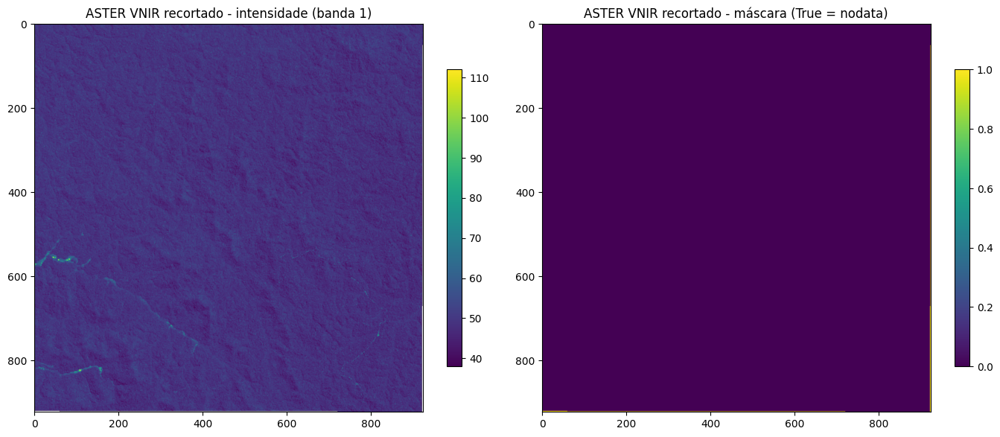

/home/ggrl/.pyenv/versions/3.13.7/envs/geologia/lib/python3.13/site-packages/IPython/core/interactiveshell.py:3394: SerializationWarning: saving variable None with floating point data as an integer dtype without any _FillValue to use for NaNs
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
/home/ggrl/.pyenv/versions/3.13.7/envs/geologia/lib/python3.13/site-packages/xarray/core/duck_array_ops.py:250: RuntimeWarning: invalid value encountered in cast
  return data.astype(dtype, **kwargs)


  Recorte ASTER salvo em: ./recortes_orbitais/SB21_ZA_II2_NW_ASTER_AST_L1T_00307292004141220_20150505110335_VNIR_clip.tif

[SENTINEL-2]
  id           : S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213
  cloud_cover  : 0.308012 %
  assets       : ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP', 'visual', 'safe-manifest', 'granule-metadata', 'inspire-metadata', 'product-metadata', 'datastrip-metadata', 'tilejson', 'rendered_preview']
  Lendo asset 'visual' e recortando para a folha...
  Fração de nodata no visual recortado: 0.0027


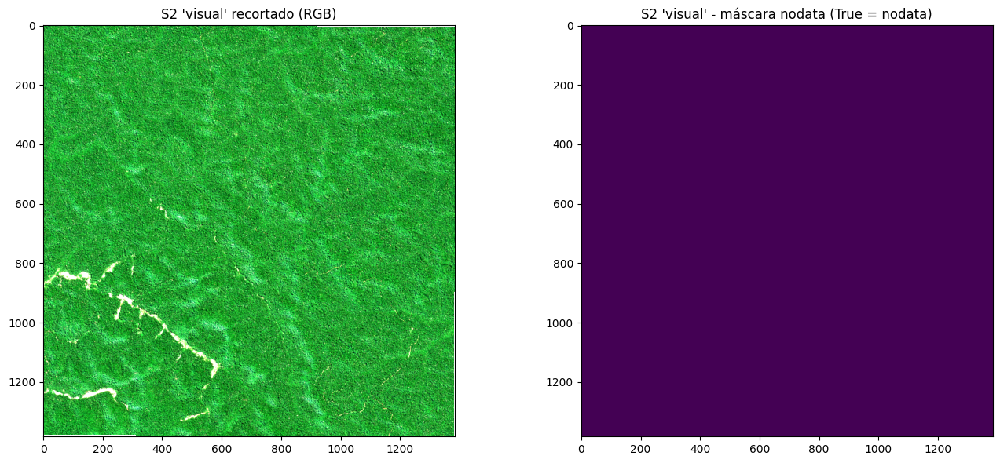

  Recorte Sentinel-2 salvo em: ./recortes_orbitais/SB21_ZA_II2_NW_S2_S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213_visual_clip.tif

[PIPELINE] Concluído.
  ASTER recortado salvo em: ./recortes_orbitais/SB21_ZA_II2_NW_ASTER_AST_L1T_00307292004141220_20150505110335_VNIR_clip.tif
  S2 recortado salvo em   : ./recortes_orbitais/SB21_ZA_II2_NW_S2_S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213_visual_clip.tif


In [2]:
#!/usr/bin/env python
from __future__ import annotations

import os
import json
from typing import Dict, Any

import numpy as np
import matplotlib.pyplot as plt

import rioxarray
from sqlalchemy import create_engine, text
from pystac_client import Client
import planetary_computer

# ----------------------------------------------------------------------
# CONFIGURAÇÕES
# ----------------------------------------------------------------------
PC_STAC_URL = "https://planetarycomputer.microsoft.com/api/stac/v1"

PG_USER = "postgres"
PG_PASS = "postgres"
PG_HOST = "localhost"
PG_PORT = "5432"
PG_DB   = "geologia"

PG_CONN_STR = (
    f"postgresql+psycopg2://{PG_USER}:{PG_PASS}@{PG_HOST}:{PG_PORT}/{PG_DB}"
)

# Folha e IDs de cena
FOLHA_CODIGO = "SB21_ZA_II2_NW"

ASTER_COLLECTION = "aster-l1t"
ASTER_ID = "AST_L1T_00307292004141220_20150505110335"

S2_COLLECTION = "sentinel-2-l2a"
S2_ID = "S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213"

# Diretório de saída para recortes
OUT_DIR = "./recortes_orbitais"
os.makedirs(OUT_DIR, exist_ok=True)


# ----------------------------------------------------------------------
# FUNÇÕES AUXILIARES
# ----------------------------------------------------------------------
def get_pc_client() -> Client:
    """
    Retorna client do Planetary Computer com assets já assinados (SAS).
    """
    return Client.open(
        PC_STAC_URL,
        modifier=planetary_computer.sign_inplace,
    )


def get_folha_geom_geojson(
    codigo_folha: str,
    conn_str: str = PG_CONN_STR,
    schema: str = "carto",
    table: str = "folhas_cartograficas",
) -> Dict[str, Any]:
    """
    Retorna a geometria da folha em WGS84 (EPSG:4326) como dict GeoJSON.
    """
    engine = create_engine(conn_str)
    sql = text(
        f"""
        SELECT ST_AsGeoJSON(ST_Transform(geom, 4326)) AS geom_json
        FROM {schema}.{table}
        WHERE codigo = :codigo
        LIMIT 1;
        """
    )
    with engine.begin() as conn:
        row = conn.execute(sql, {"codigo": codigo_folha}).fetchone()

    if row is None or row.geom_json is None:
        raise RuntimeError(f"Não foi encontrada geometria para a folha '{codigo_folha}'")

    return json.loads(row.geom_json)


def get_signed_item(collection_id: str, item_id: str):
    """
    Obtém um pystac.Item assinado (assets com SAS) da coleção/ID especificados.
    """
    api = get_pc_client()
    search = api.search(
        collections=[collection_id],
        ids=[item_id],
        max_items=1,
    )
    item = next(search.items(), None)
    if item is None:
        raise RuntimeError(f"Item {item_id} não encontrado na coleção {collection_id}")
    return item


def clip_raster_to_folha(href: str, folha_geom_geojson: dict):
    """
    Abre o raster indicado por href e recorta para a geometria da folha (EPSG:4326).
    """
    da = rioxarray.open_rasterio(href, masked=True)
    da_clip = da.rio.clip([folha_geom_geojson], crs="EPSG:4326", drop=True)
    return da_clip


def compute_nodata_fraction(da_clip):
    """
    Fração de pixels nodata no recorte.
    Se houver várias bandas, nodata = todas as bandas NaN.
    """
    arr = da_clip.values
    if arr.ndim == 3:
        nodata_mask = np.all(np.isnan(arr), axis=0)
    else:
        nodata_mask = np.isnan(arr)
    frac = nodata_mask.sum() / nodata_mask.size
    return frac, nodata_mask


# ----------------------------------------------------------------------
# INSPEÇÃO E SALVAMENTO ASTER
# ----------------------------------------------------------------------
def process_aster_for_folha(
    folha_geom: dict,
    collection_id: str,
    item_id: str,
    out_dir: str,
    folha_codigo: str,
):
    item = get_signed_item(collection_id, item_id)

    print("\n[ASTER]")
    print(f"  id           : {item.id}")
    print(f"  cloud_cover  : {item.properties.get('eo:cloud_cover')} %")
    print(f"  assets       : {list(item.assets.keys())}")

    # Escolher VNIR se existir
    if "VNIR" in item.assets:
        asset_key = "VNIR"
    else:
        asset_key = list(item.assets.keys())[0]
        print(f"  Asset 'VNIR' não encontrado, usando '{asset_key}'.")

    href = item.assets[asset_key].href
    print(f"  Lendo asset '{asset_key}' e recortando para a folha...")

    da_clip = clip_raster_to_folha(href, folha_geom)
    frac_nodata, nodata_mask = compute_nodata_fraction(da_clip)
    print(f"  Fração de pixels nodata no recorte ASTER: {frac_nodata:.4f}")

    # Visualização simples (banda 1)
    if "band" in da_clip.dims:
        da_plot = da_clip.isel(band=0)
    else:
        da_plot = da_clip

    data = da_plot.values

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    im1 = ax1.imshow(data, origin="upper")
    ax1.set_title("ASTER VNIR recortado - intensidade (banda 1)")
    fig.colorbar(im1, ax=ax1, shrink=0.7)

    im2 = ax2.imshow(nodata_mask, origin="upper")
    ax2.set_title("ASTER VNIR recortado - máscara (True = nodata)")
    fig.colorbar(im2, ax=ax2, shrink=0.7)

    plt.tight_layout()
    plt.show()

    # Salvar recorte em GeoTIFF
    out_path = os.path.join(
        out_dir,
        f"{folha_codigo}_ASTER_{item.id}_{asset_key}_clip.tif",
    )
    da_clip.rio.to_raster(out_path)
    print(f"  Recorte ASTER salvo em: {out_path}")

    return da_clip, nodata_mask, out_path


# ----------------------------------------------------------------------
# INSPEÇÃO E SALVAMENTO SENTINEL-2
# ----------------------------------------------------------------------
def process_s2_for_folha(
    folha_geom: dict,
    collection_id: str,
    item_id: str,
    out_dir: str,
    folha_codigo: str,
):
    item = get_signed_item(collection_id, item_id)

    print("\n[SENTINEL-2]")
    print(f"  id           : {item.id}")
    print(f"  cloud_cover  : {item.properties.get('eo:cloud_cover')} %")
    print(f"  assets       : {list(item.assets.keys())}")

    # Asset visual (RGB)
    if "visual" in item.assets:
        visual_key = "visual"
    else:
        visual_key = list(item.assets.keys())[0]
        print(f"  Asset 'visual' não encontrado, usando '{visual_key}'.")

    href_vis = item.assets[visual_key].href
    print(f"  Lendo asset '{visual_key}' e recortando para a folha...")

    da_vis_clip = clip_raster_to_folha(href_vis, folha_geom)
    frac_nodata_vis, nodata_mask_vis = compute_nodata_fraction(da_vis_clip)
    print(f"  Fração de nodata no visual recortado: {frac_nodata_vis:.4f}")

    arr = da_vis_clip.values
    if arr.ndim == 3 and da_vis_clip.sizes.get("band", 1) >= 3:
        # Normaliza para visualização (2–98 percentil)
        arr = arr.astype("float32")
        valid = arr[~np.isnan(arr)]
        if valid.size > 0:
            vmin = np.nanpercentile(valid, 2)
            vmax = np.nanpercentile(valid, 98)
            scale = vmax - vmin if vmax > vmin else 1.0
            arr_scaled = (arr - vmin) / scale
            arr_scaled = np.clip(arr_scaled, 0, 1)
        else:
            arr_scaled = np.zeros_like(arr)

        rgb = np.transpose(arr_scaled[:3, :, :], (1, 2, 0))

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
        ax1.imshow(rgb)
        ax1.set_title("S2 'visual' recortado (RGB)")

        ax2.imshow(nodata_mask_vis, origin="upper")
        ax2.set_title("S2 'visual' - máscara nodata (True = nodata)")
        plt.tight_layout()
        plt.show()
    else:
        data = da_vis_clip.values
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
        im1 = ax1.imshow(data, origin="upper")
        ax1.set_title("S2 recortado - intensidade")
        fig.colorbar(im1, ax=ax1, shrink=0.7)

        im2 = ax2.imshow(nodata_mask_vis, origin="upper")
        ax2.set_title("S2 recortado - máscara nodata")
        fig.colorbar(im2, ax=ax2, shrink=0.7)
        plt.tight_layout()
        plt.show()

    # Salvar recorte em GeoTIFF
    out_path = os.path.join(
        out_dir,
        f"{folha_codigo}_S2_{item.id}_{visual_key}_clip.tif",
    )
    da_vis_clip.rio.to_raster(out_path)
    print(f"  Recorte Sentinel-2 salvo em: {out_path}")

    return da_vis_clip, nodata_mask_vis, out_path


# ----------------------------------------------------------------------
# MAIN
# ----------------------------------------------------------------------
def main():
    print("=" * 80)
    print(f"[PIPELINE] Folha alvo: {FOLHA_CODIGO}")
    print("=" * 80)

    folha_geom = get_folha_geom_geojson(FOLHA_CODIGO)
    print(f"[PIPELINE] Geometria da folha '{FOLHA_CODIGO}' carregada (EPSG:4326).")

    # ASTER
    da_aster, ast_nodata_mask, ast_out = process_aster_for_folha(
        folha_geom=folha_geom,
        collection_id=ASTER_COLLECTION,
        item_id=ASTER_ID,
        out_dir=OUT_DIR,
        folha_codigo=FOLHA_CODIGO,
    )

    # Sentinel-2
    da_s2, s2_nodata_mask, s2_out = process_s2_for_folha(
        folha_geom=folha_geom,
        collection_id=S2_COLLECTION,
        item_id=S2_ID,
        out_dir=OUT_DIR,
        folha_codigo=FOLHA_CODIGO,
    )

    print("\n[PIPELINE] Concluído.")
    print(f"  ASTER recortado salvo em: {ast_out}")
    print(f"  S2 recortado salvo em   : {s2_out}")


# ----------------------------------------------------------------------
# EXECUÇÃO (se for rodar como script .py)
# ----------------------------------------------------------------------
if __name__ == "__main__":
    main()


[PIPELINE GS] Folha alvo: SB21_ZA_II2_NE
[PIPELINE] Geometria da folha 'SB21_ZA_II2_NE' carregada (EPSG:4326).

[SENTINEL-2] Metadados:
  id          : S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213
  cloud_cover : 0.308012 %
  assets      : ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP', 'visual', 'safe-manifest', 'granule-metadata', 'inspire-metadata', 'product-metadata', 'datastrip-metadata', 'tilejson', 'rendered_preview']
  Bandas S2 carregadas: ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B11', 'B12']
  Fração média de nodata nas bandas S2: 0.0021

[ASTER] Metadados:
  id     : AST_L1T_00307292004141220_20150505110335
  assets : ['TIR', 'xml', 'SWIR', 'VNIR', 'qa-txt', 'tilejson', 'tir-browse', 'vnir-browse', 'rendered_preview']
  Bandas ASTER (VNIR+SWIR) carregadas: [np.str_('VNIR_1'), np.str_('VNIR_2'), np.str_('VNIR_3'), np.str_('SWIR_4'), np.str_('SWIR_5'), np.str_('SWIR_6'), np.str_('SWIR_7'), np.

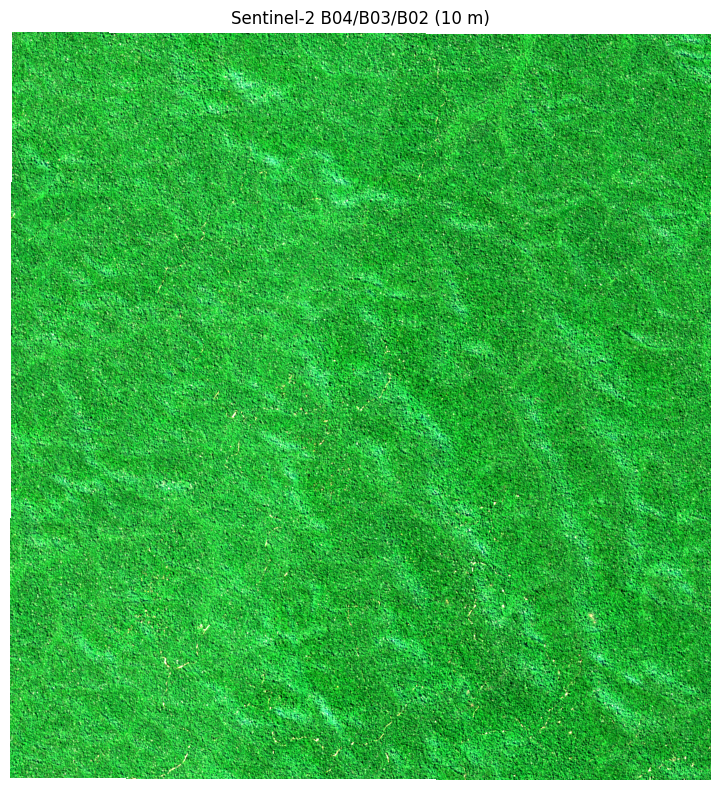

[Quicklook] ASTER fusionado (VNIR_1, VNIR_2, VNIR_3 ~ pseudo-RGB):


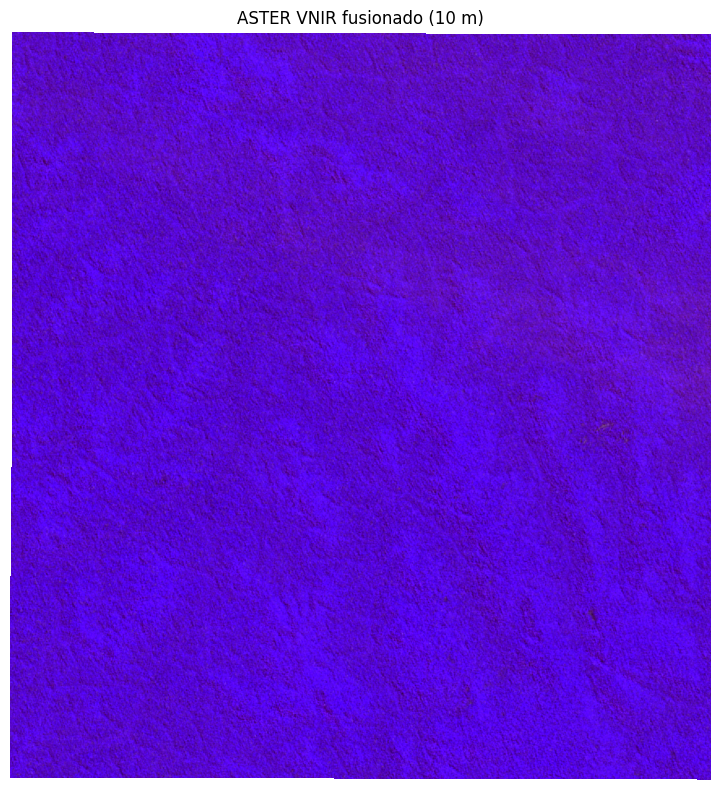


[OUTPUT] Sentinel-2 stack salvo em: ./recortes_orbitais/SB21_ZA_II2_NE_S2_S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213_stack.tif
[OUTPUT] ASTER VNIR+SWIR (reamostrado) salvo em: ./recortes_orbitais/SB21_ZA_II2_NE_ASTER_AST_L1T_00307292004141220_20150505110335_VNIR_SWIR_10m.tif
[OUTPUT] ASTER VNIR+SWIR fusionado (GS) salvo em: ./recortes_orbitais/SB21_ZA_II2_NE_ASTER_AST_L1T_00307292004141220_20150505110335_VNIR_SWIR_GS_10m.tif

[PIPELINE GS] Concluído.


In [3]:
#!/usr/bin/env python
from __future__ import annotations

import os
import json
from typing import Dict, Any, List, Tuple

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

import rioxarray
import requests
from sqlalchemy import create_engine, text
from pystac_client import Client
import planetary_computer

# ----------------------------------------------------------------------
# CONFIGURAÇÕES
# ----------------------------------------------------------------------
PC_STAC_URL = "https://planetarycomputer.microsoft.com/api/stac/v1"

PG_USER = "postgres"
PG_PASS = "postgres"
PG_HOST = "localhost"
PG_PORT = "5432"
PG_DB   = "geologia"

PG_CONN_STR = (
    f"postgresql+psycopg2://{PG_USER}:{PG_PASS}@{PG_HOST}:{PG_PORT}/{PG_DB}"
)

# Folha e IDs de cena
FOLHA_CODIGO = "SB21_ZA_II2_NW"

ASTER_COLLECTION = "aster-l1t"
ASTER_ID = "AST_L1T_00307292004141220_20150505110335"

S2_COLLECTION = "sentinel-2-l2a"
S2_ID = "S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213"

# Bandas Sentinel-2 desejadas
S2_BANDS = [
    "B02", "B03", "B04",
    "B05", "B06", "B07", "B08", "B8A",
    "B11", "B12",
]

# Diretórios de saída
OUT_DIR = "./recortes_orbitais"
os.makedirs(OUT_DIR, exist_ok=True)

# Cache local para GeoTIFFs baixados do Planetary Computer
PC_CACHE_DIR = os.path.join(OUT_DIR, "pc_cache")
os.makedirs(PC_CACHE_DIR, exist_ok=True)


# ----------------------------------------------------------------------
# FUNÇÕES AUXILIARES: CONEXÃO E GEOMETRIA
# ----------------------------------------------------------------------
def get_pc_client() -> Client:
    """
    Retorna o client do Planetary Computer com assets já assinados (SAS).
    """
    return Client.open(
        PC_STAC_URL,
        modifier=planetary_computer.sign_inplace,
    )


def get_folha_geom_geojson(
    codigo_folha: str,
    conn_str: str = PG_CONN_STR,
    schema: str = "carto",
    table: str = "folhas_cartograficas",
) -> Dict[str, Any]:
    """
    Retorna a geometria da folha em WGS84 (EPSG:4326) como dict GeoJSON.
    """
    engine = create_engine(conn_str)
    sql = text(
        f"""
        SELECT ST_AsGeoJSON(ST_Transform(geom, 4326)) AS geom_json
        FROM {schema}.{table}
        WHERE codigo = :codigo
        LIMIT 1;
        """
    )
    with engine.begin() as conn:
        row = conn.execute(sql, {"codigo": codigo_folha}).fetchone()

    if row is None or row.geom_json is None:
        raise RuntimeError(f"Não foi encontrada geometria para a folha '{codigo_folha}'")

    return json.loads(row.geom_json)


def get_signed_item(collection_id: str, item_id: str):
    """
    Obtém um pystac.Item assinado (assets com SAS) da coleção/ID especificados.
    """
    api = get_pc_client()
    search = api.search(
        collections=[collection_id],
        ids=[item_id],
        max_items=1,
    )
    item = next(search.items(), None)
    if item is None:
        raise RuntimeError(f"Item {item_id} não encontrado na coleção {collection_id}")
    return item


def download_pc_asset_to_local(href: str, cache_dir: str = PC_CACHE_DIR) -> str:
    """
    Faz download de um asset do Planetary Computer para um arquivo local
    dentro de cache_dir e retorna o caminho local.

    Se já existir um arquivo com o mesmo nome (sem a querystring), reutiliza.
    """
    os.makedirs(cache_dir, exist_ok=True)

    # Usa apenas o nome do arquivo, sem parâmetros da query (?st=...&se=...)
    filename = href.split("/")[-1].split("?")[0]
    local_path = os.path.join(cache_dir, filename)

    if os.path.exists(local_path):
        print(f"[PC] Usando cache local: {local_path}")
        return local_path

    print(f"[PC] Baixando asset para cache local: {local_path}")
    with requests.get(href, stream=True, timeout=300) as r:
        r.raise_for_status()
        with open(local_path, "wb") as f:
            for chunk in r.iter_content(chunk_size=16 * 1024 * 1024):
                if chunk:
                    f.write(chunk)

    return local_path


def _clip_raster_to_folha_direct(href: str, folha_geom_geojson: dict):
    """
    Lógica direta de abertura + clip (sem fallback).
    """
    da = rioxarray.open_rasterio(href, masked=True)
    # 0 costuma ser nodata -> convertemos para NaN
    da = da.where(da != 0)
    da_clip = da.rio.clip([folha_geom_geojson], crs="EPSG:4326", drop=True)
    return da_clip.astype("float32")


def clip_raster_to_folha(href: str, folha_geom_geojson: dict):
    """
    Abre o raster indicado por href e recorta para a geometria da folha (EPSG:4326).

    Tenta primeiro ler via streaming HTTP (href remoto). Se falhar com erro de leitura
    do GeoTIFF, faz download completo do arquivo para disco local e relê a partir
    desse arquivo local.
    """
    try:
        return _clip_raster_to_folha_direct(href, folha_geom_geojson)
    except Exception as e:
        print(f"[WARN] Falha ao ler raster remoto via href:")
        print(f"       {href}")
        print(f"       Erro: {e}")
        print("       Fazendo download completo do asset e reabrindo localmente...")

        local_path = download_pc_asset_to_local(href)
        return _clip_raster_to_folha_direct(local_path, folha_geom_geojson)


# ----------------------------------------------------------------------
# SANITIZAÇÃO DE METADADOS PARA TO_RASTER
# ----------------------------------------------------------------------
def sanitize_long_name(da: xr.DataArray) -> xr.DataArray:
    """
    Remove atributo 'long_name' inconsistente com o número de bandas.

    Evita RioXarrayError: Number of names in the 'long_name' attribute
    does not equal the number of bands.
    """
    long_name = da.attrs.get("long_name", None)
    n_bands = da.sizes.get("band", 1)

    if isinstance(long_name, (list, tuple)):
        if len(long_name) != n_bands:
            da = da.copy()
            da.attrs.pop("long_name", None)
    return da


# ----------------------------------------------------------------------
# CARREGAR E ORGANIZAR BANDAS SENTINEL-2
# ----------------------------------------------------------------------
def load_s2_bands_for_folha(
    item,
    folha_geom: dict,
    band_ids: List[str],
) -> Tuple[xr.DataArray, Dict[str, xr.DataArray]]:
    """
    Carrega e recorta as bandas do Sentinel-2 para a folha.
    Todas são reprojetadas para a grade de referência (10 m) de B02.

    Retorna:
        ref_da : DataArray de referência (B02 recortada).
        s2_bands: dict {band_name: DataArray recortada e reamostrada}.
    """
    assets = item.assets

    # 1) B02 como referência (10 m)
    if "B02" not in assets:
        raise RuntimeError("Asset B02 não encontrado no Sentinel-2 item.")
    ref_href = assets["B02"].href
    ref_da = clip_raster_to_folha(ref_href, folha_geom)

    # 2) Demais bandas reprojetadas na grade de B02
    s2_bands: Dict[str, xr.DataArray] = {}
    for bname in band_ids:
        if bname not in assets:
            print(f"[S2] Aviso: banda {bname} não encontrada no item. Pulando.")
            continue
        da_b = clip_raster_to_folha(assets[bname].href, folha_geom)
        da_b = da_b.rio.reproject_match(ref_da)
        s2_bands[bname] = da_b

    return ref_da, s2_bands


# ----------------------------------------------------------------------
# CARREGAR VNIR + SWIR ASTER NA MESMA GRADE DO SENTINEL-2
# ----------------------------------------------------------------------
def load_aster_vnir_swir_for_folha(
    item,
    folha_geom: dict,
    s2_ref_da: xr.DataArray,
) -> xr.DataArray:
    """
    Carrega VNIR e SWIR do ASTER, recorta para a folha e reprojeta
    para a grade do DataArray de referência (Sentinel B02, 10 m).

    Retorna DataArray com dims ("band", "y", "x") contendo:
    [VNIR_Band1, VNIR_Band2, VNIR_Band3N, SWIR_Band4..SWIR_Band9]
    """
    assets = item.assets

    if "VNIR" not in assets:
        raise RuntimeError("Asset 'VNIR' não encontrado no ASTER item.")
    if "SWIR" not in assets:
        raise RuntimeError("Asset 'SWIR' não encontrado no ASTER item.")

    da_vnir = clip_raster_to_folha(assets["VNIR"].href, folha_geom)
    da_swir = clip_raster_to_folha(assets["SWIR"].href, folha_geom)

    # Reprojetar para grade de referência (10 m)
    da_vnir_match = da_vnir.rio.reproject_match(s2_ref_da)
    da_swir_match = da_swir.rio.reproject_match(s2_ref_da)

    # Concatena as bandas VNIR + SWIR
    aster_all = xr.concat(
        [da_vnir_match, da_swir_match],
        dim="band",
    )

    # Renomear índices de banda de forma consistente
    nb_vnir = da_vnir_match.sizes["band"]
    nb_swir = da_swir_match.sizes["band"]
    band_names = (
        [f"VNIR_{i+1}" for i in range(nb_vnir)] +
        [f"SWIR_{i+4}" for i in range(nb_swir)]
    )
    aster_all = aster_all.assign_coords(band=("band", band_names))

    # Sanitizar long_name herdado
    aster_all = sanitize_long_name(aster_all)

    return aster_all


# ----------------------------------------------------------------------
# CÁLCULO DE FRAÇÃO NODATA
# ----------------------------------------------------------------------
def compute_nodata_fraction(da: xr.DataArray) -> float:
    """
    Fração de pixels nodata (NaN) no cubo.
    Calcula a fração de NaN por banda e tira a média.
    """
    arr = da.values
    if arr.ndim == 3:
        band_nan_frac = np.isnan(arr).sum(axis=(1, 2)) / (arr.shape[1] * arr.shape[2])
        return float(band_nan_frac.mean())
    elif arr.ndim == 2:
        return float(np.isnan(arr).sum() / arr.size)
    else:
        raise ValueError("DataArray com dimensão inesperada para cálculo de nodata.")


# ----------------------------------------------------------------------
# OLS PARA PAN SINTÉTICO
# ----------------------------------------------------------------------
def ols_synthetic_pan(
    aster_ms: xr.DataArray,
    pan_da: xr.DataArray,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Constrói uma imagem pancromática sintética a partir das bandas ASTER
    por regressão linear (OLS) contra o PAN do Sentinel-2.

    aster_ms: DataArray (band, y, x) com VNIR+SWIR.
    pan_da : DataArray (y, x) do Sentinel-2 (ex: B08).
    """
    ms = aster_ms.values  # (nb, ny, nx)
    pan = pan_da.values   # (ny, nx)

    nb, ny, nx = ms.shape
    ms_flat = ms.reshape(nb, ny * nx).T  # (Npix, nb)
    pan_flat = pan.reshape(-1)           # (Npix,)

    mask = np.isfinite(pan_flat)
    for b in range(nb):
        mask &= np.isfinite(ms_flat[:, b])

    if mask.sum() < nb + 1:
        raise RuntimeError("Poucos píxeis válidos para OLS (ASTER vs PAN).")

    X = ms_flat[mask, :]  # (Nvalid, nb)
    y = pan_flat[mask]    # (Nvalid,)

    w, *_ = np.linalg.lstsq(X, y, rcond=None)
    pan_synth_flat = ms_flat @ w
    pan_synth = pan_synth_flat.reshape(ny, nx).astype("float32")

    return pan_synth, w.astype("float32")


# ----------------------------------------------------------------------
# TRANSFORMAÇÃO GRAM–SCHMIDT
# ----------------------------------------------------------------------
def gs_forward(
    bands: List[np.ndarray],
) -> Tuple[List[np.ndarray], List[float], List[List[float]]]:
    """
    Aplica a transformação Gram–Schmidt (GS) às bandas de entrada.

    bands: lista de arrays 2D (y, x).
    """
    n = len(bands)
    gs_list: List[np.ndarray] = []
    mu_list: List[float] = []
    phi: List[List[float]] = [[0.0] * n for _ in range(n)]

    for T in range(n):
        BT = bands[T].astype("float64")
        mu_T = np.nanmean(BT)
        BTc = BT - mu_T

        GST = BTc.copy()
        for l in range(T):
            GSl = gs_list[l]
            cov = np.nanmean((BT - mu_T) * GSl)
            var = np.nanmean(GSl * GSl)
            coeff = cov / var if var not in (0, np.nan) else 0.0
            GST = GST - coeff * GSl
            phi[T][l] = float(coeff)

        gs_list.append(GST.astype("float32"))
        mu_list.append(float(mu_T))

    return gs_list, mu_list, phi


def gs_inverse(
    gs_list: List[np.ndarray],
    mu_list: List[float],
    phi: List[List[float]],
) -> List[np.ndarray]:
    """
    Inversa da transformação GS para reconstruir bandas originais.
    """
    n = len(gs_list)
    bands_rec: List[np.ndarray] = []

    for T in range(n):
        GST = gs_list[T].astype("float64")
        BT_rec = GST + mu_list[T]
        for l in range(T):
            BT_rec += phi[T][l] * gs_list[l]
        bands_rec.append(BT_rec.astype("float32"))

    return bands_rec


def gs_fusion_aster_with_pan(
    aster_ms: xr.DataArray,
    pan_da: xr.DataArray,
) -> xr.DataArray:
    """
    Aplica fusão GS entre ASTER (VNIR+SWIR) e PAN do Sentinel-2 (ex: B08).
    """
    pan_synth, _ = ols_synthetic_pan(aster_ms, pan_da)

    ms = aster_ms.values  # (nb, ny, nx)
    nb, ny, nx = ms.shape

    band_list: List[np.ndarray] = [pan_synth]
    for b in range(nb):
        band_list.append(ms[b, :, :])

    gs_list, mu_list, phi = gs_forward(band_list)

    pan_real = pan_da.values.astype("float32")
    gs0 = gs_list[0]

    pan_mean = np.nanmean(pan_real)
    gs0_mean = np.nanmean(gs0)
    pan_std = np.nanstd(pan_real)
    gs0_std = np.nanstd(gs0)

    if pan_std == 0 or np.isnan(pan_std):
        pan_adj = pan_real - pan_mean
    else:
        scale = gs0_std / pan_std if gs0_std not in (0, np.nan) else 1.0
        pan_adj = (pan_real - pan_mean) * scale

    gs_list[0] = pan_adj.astype("float32")

    bands_rec = gs_inverse(gs_list, mu_list, phi)

    rec_aster = bands_rec[1:]
    arr_fused = np.stack(rec_aster, axis=0)  # (nb, ny, nx)

    aster_fused = xr.DataArray(
        data=arr_fused,
        dims=("band", "y", "x"),
        coords={
            "band": aster_ms.band,
            "y": aster_ms.y,
            "x": aster_ms.x,
        },
        attrs=aster_ms.attrs,
    )
    aster_fused.rio.write_crs(aster_ms.rio.crs, inplace=True)
    aster_fused.rio.write_transform(aster_ms.rio.transform(), inplace=True)

    # Sanitiza long_name do fusionado
    aster_fused = sanitize_long_name(aster_fused)

    return aster_fused


# ----------------------------------------------------------------------
# VISUALIZAÇÃO BÁSICA
# ----------------------------------------------------------------------
def quicklook_three_bands(
    da: xr.DataArray,
    bands_idx: Tuple[int, int, int] = (0, 1, 2),
    title: str = "",
):
    """
    Quicklook RGB para um cubo (band, y, x).
    """
    nb = da.sizes["band"]
    if max(bands_idx) >= nb:
        print(f"[Quicklook] Menos de {max(bands_idx)+1} bandas; pulando quicklook.")
        return

    arr = da.isel(band=list(bands_idx)).values.astype("float32")

    valid = arr[np.isfinite(arr)]
    if valid.size == 0:
        print("[Quicklook] Nenhum pixel válido para visualização.")
        return

    vmin = np.nanpercentile(valid, 2)
    vmax = np.nanpercentile(valid, 98)
    scale = vmax - vmin if vmax > vmin else 1.0
    arr_norm = np.clip((arr - vmin) / scale, 0, 1)

    rgb = np.transpose(arr_norm, (1, 2, 0))

    plt.figure(figsize=(8, 8))
    plt.imshow(rgb)
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


# ----------------------------------------------------------------------
# MAIN
# ----------------------------------------------------------------------
def main():
    print("=" * 80)
    print(f"[PIPELINE GS] Folha alvo: {FOLHA_CODIGO}")
    print("=" * 80)

    # 1) Geometria da folha
    folha_geom = get_folha_geom_geojson(FOLHA_CODIGO)
    print(f"[PIPELINE] Geometria da folha '{FOLHA_CODIGO}' carregada (EPSG:4326).")

    # 2) Sentinel-2
    s2_item = get_signed_item(S2_COLLECTION, S2_ID)
    print("\n[SENTINEL-2] Metadados:")
    print(f"  id          : {s2_item.id}")
    print(f"  cloud_cover : {s2_item.properties.get('eo:cloud_cover')} %")
    print(f"  assets      : {list(s2_item.assets.keys())}")

    s2_ref_da, s2_bands = load_s2_bands_for_folha(
        item=s2_item,
        folha_geom=folha_geom,
        band_ids=S2_BANDS,
    )
    print(f"  Bandas S2 carregadas: {list(s2_bands.keys())}")

    # Empilhar bandas S2
    s2_stack_list = []
    s2_band_labels = []
    for bname in S2_BANDS:
        if bname in s2_bands:
            da_b = s2_bands[bname]
            if "band" in da_b.dims and da_b.sizes.get("band", 1) == 1:
                arr = da_b.isel(band=0).values
            else:
                arr = da_b.values[0, :, :]
            s2_stack_list.append(arr)
            s2_band_labels.append(bname)

    s2_stack = xr.DataArray(
        data=np.stack(s2_stack_list, axis=0),
        dims=("band", "y", "x"),
        coords={
            "band": s2_band_labels,
            "y": s2_ref_da.y,
            "x": s2_ref_da.x,
        },
        attrs={"description": "Sentinel-2 bands recortadas"},
    )
    s2_stack.rio.write_crs(s2_ref_da.rio.crs, inplace=True)
    s2_stack.rio.write_transform(s2_ref_da.rio.transform(), inplace=True)

    frac_nodata_s2 = compute_nodata_fraction(s2_stack)
    print(f"  Fração média de nodata nas bandas S2: {frac_nodata_s2:.4f}")

    # 3) ASTER
    aster_item = get_signed_item(ASTER_COLLECTION, ASTER_ID)
    print("\n[ASTER] Metadados:")
    print(f"  id     : {aster_item.id}")
    print(f"  assets : {list(aster_item.assets.keys())}")

    aster_ms = load_aster_vnir_swir_for_folha(
        item=aster_item,
        folha_geom=folha_geom,
        s2_ref_da=s2_ref_da,
    )
    print(f"  Bandas ASTER (VNIR+SWIR) carregadas: {list(aster_ms.band.values)}")

    frac_nodata_aster = compute_nodata_fraction(aster_ms)
    print(f"  Fração média de nodata em ASTER (VNIR+SWIR): {frac_nodata_aster:.4f}")

    # 4) Fusão GS com PAN = B08
    if "B08" not in s2_bands:
        raise RuntimeError("B08 não carregada do Sentinel-2; necessário para PAN.")

    da_B08 = s2_bands["B08"]
    if "band" in da_B08.dims and da_B08.sizes.get("band", 1) == 1:
        da_B08_2d = da_B08.isel(band=0)
    else:
        da_B08_2d = da_B08

    print("\n[GS] Iniciando fusão Gram–Schmidt ASTER (VNIR+SWIR) + S2 B08 ...")
    aster_fused = gs_fusion_aster_with_pan(
        aster_ms=aster_ms,
        pan_da=da_B08_2d,
    )
    print("[GS] Fusão concluída.")

    # 5) Quicklooks
    print("\n[Quicklook] Sentinel-2 (B04,B03,B02) recortado:")
    try:
        idx_b04 = s2_band_labels.index("B04")
        idx_b03 = s2_band_labels.index("B03")
        idx_b02 = s2_band_labels.index("B02")
        quicklook_three_bands(
            s2_stack,
            bands_idx=(idx_b04, idx_b03, idx_b02),
            title="Sentinel-2 B04/B03/B02 (10 m)",
        )
    except ValueError:
        print("[Quicklook] Não foi possível localizar B04/B03/B02 em s2_band_labels.")

    print("[Quicklook] ASTER fusionado (VNIR_1, VNIR_2, VNIR_3 ~ pseudo-RGB):")
    quicklook_three_bands(
        aster_fused,
        bands_idx=(0, 1, 2),
        title="ASTER VNIR fusionado (10 m)",
    )

    # 6) Salvar resultados
    s2_out = os.path.join(
        OUT_DIR,
        f"{FOLHA_CODIGO}_S2_{S2_ID}_stack.tif",
    )
    s2_stack.rio.to_raster(s2_out)
    print(f"\n[OUTPUT] Sentinel-2 stack salvo em: {s2_out}")

    # Sanitizar long_name antes de salvar ASTER orig e fusionado
    aster_ms_sanit = sanitize_long_name(aster_ms)
    aster_ms_out = os.path.join(
        OUT_DIR,
        f"{FOLHA_CODIGO}_ASTER_{ASTER_ID}_VNIR_SWIR_10m.tif",
    )
    aster_ms_sanit.rio.to_raster(aster_ms_out)
    print(f"[OUTPUT] ASTER VNIR+SWIR (reamostrado) salvo em: {aster_ms_out}")

    aster_fused_sanit = sanitize_long_name(aster_fused)
    aster_fused_out = os.path.join(
        OUT_DIR,
        f"{FOLHA_CODIGO}_ASTER_{ASTER_ID}_VNIR_SWIR_GS_10m.tif",
    )
    aster_fused_sanit.rio.to_raster(aster_fused_out)
    print(f"[OUTPUT] ASTER VNIR+SWIR fusionado (GS) salvo em: {aster_fused_out}")

    print("\n[PIPELINE GS] Concluído.")


# ----------------------------------------------------------------------
# EXECUÇÃO
# ----------------------------------------------------------------------
if __name__ == "__main__":
    main()



=== Análise ASTER MS vs GS :: SB21_ZA_II2_NW ===
1        corr=0.4787  RMSE=  2.3013  bias=  0.0022


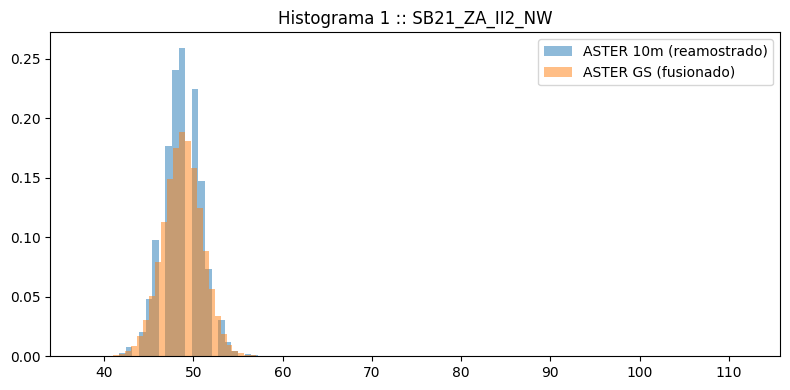

2        corr=0.8903  RMSE=  0.9005  bias=  0.0009


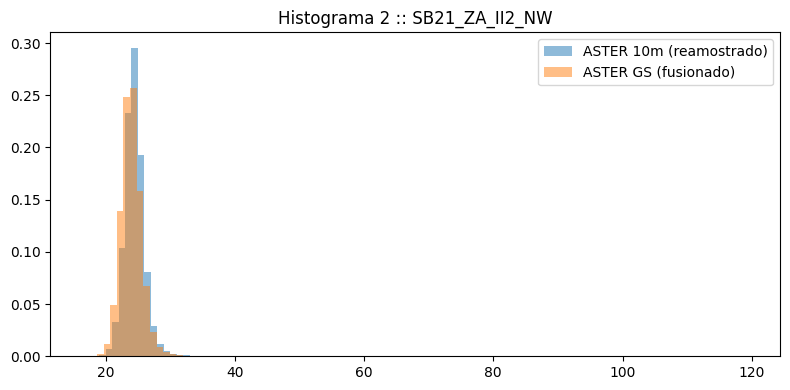

3        corr=0.8807  RMSE=  4.8943  bias=  0.0047


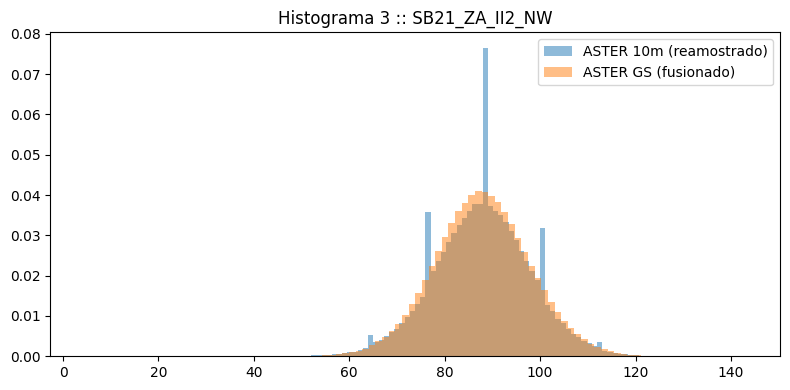

4        corr=0.7742  RMSE=  1.1837  bias=  0.0011


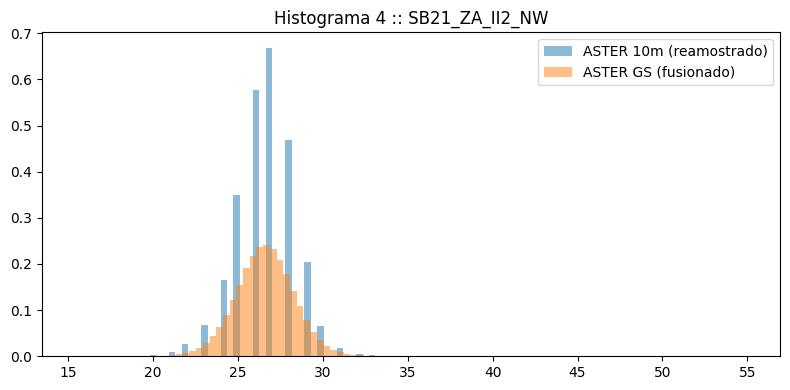

5        corr=0.7777  RMSE=  0.7796  bias=  0.0007


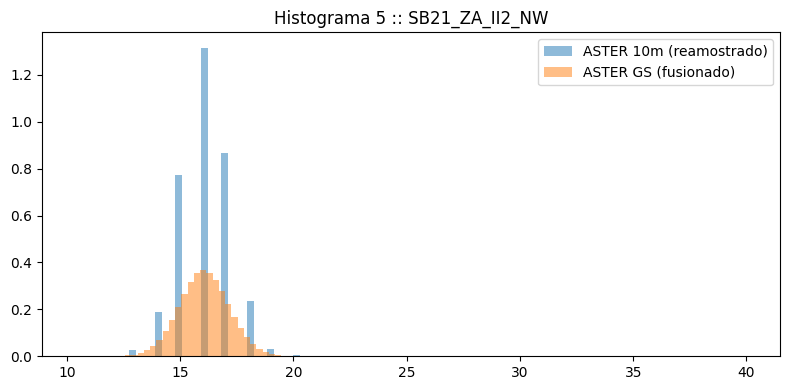

6        corr=0.8419  RMSE=  0.7590  bias=  0.0007


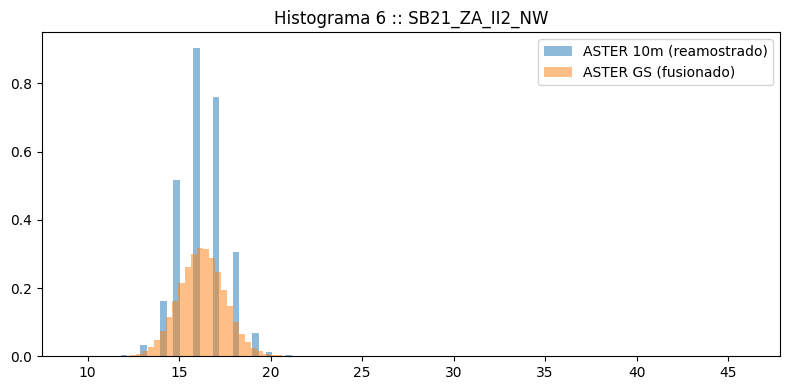

7        corr=0.9615  RMSE=  0.2909  bias=  0.0003


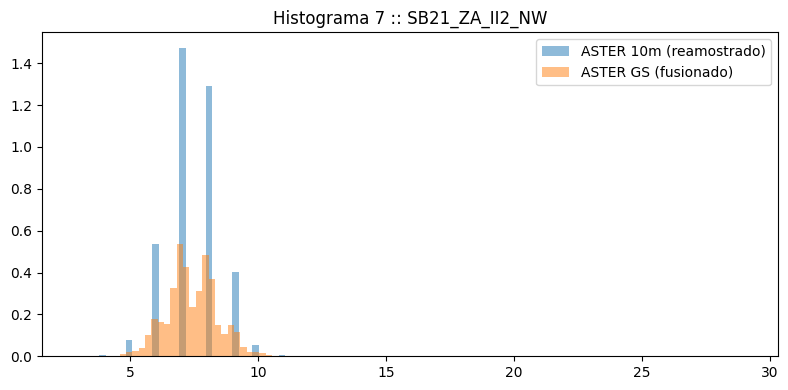

8        corr=0.9080  RMSE=  0.3901  bias=  0.0004


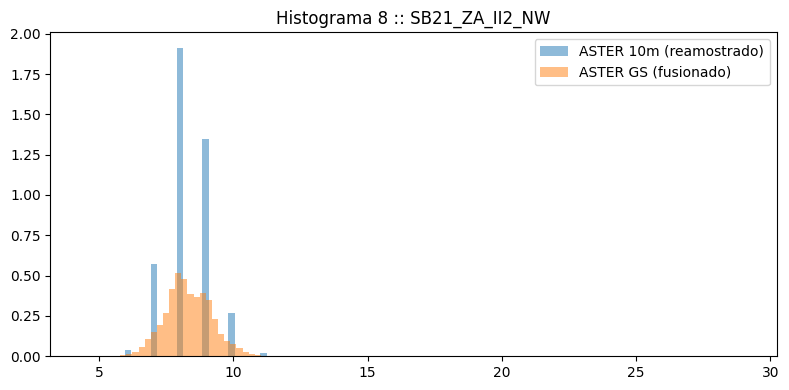

9        corr=0.6705  RMSE=  0.7540  bias=  0.0007


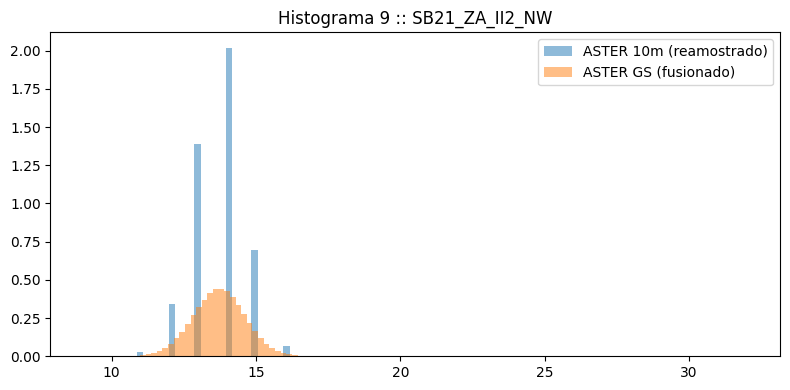


=== Análise ASTER MS vs GS :: SB21_ZA_II2_NE ===
1        corr=0.6239  RMSE=  2.2245  bias=  0.0002


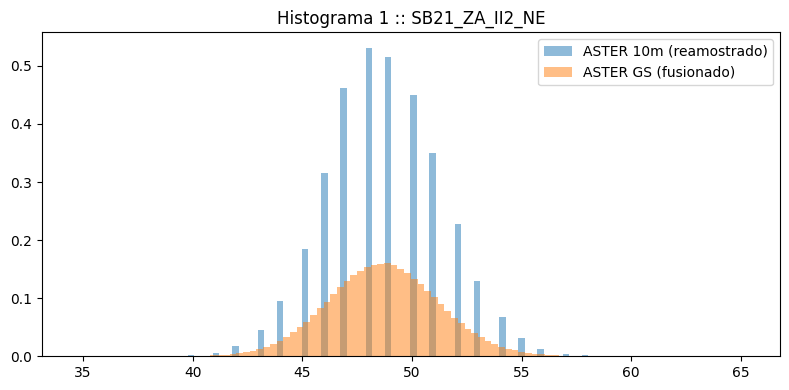

2        corr=0.8900  RMSE=  0.8576  bias=  0.0001


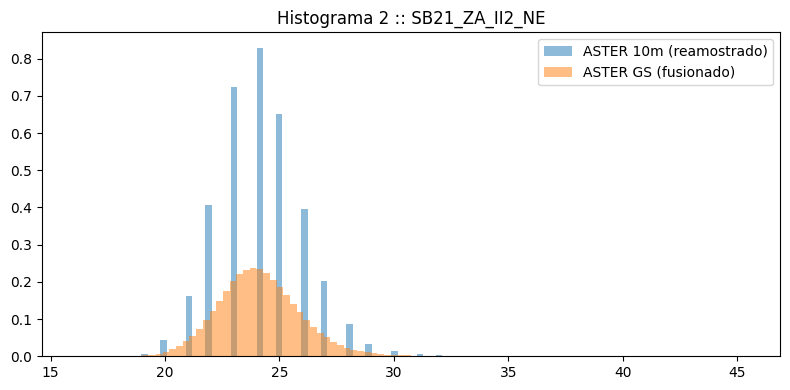

3        corr=0.8769  RMSE=  4.5700  bias=  0.0003


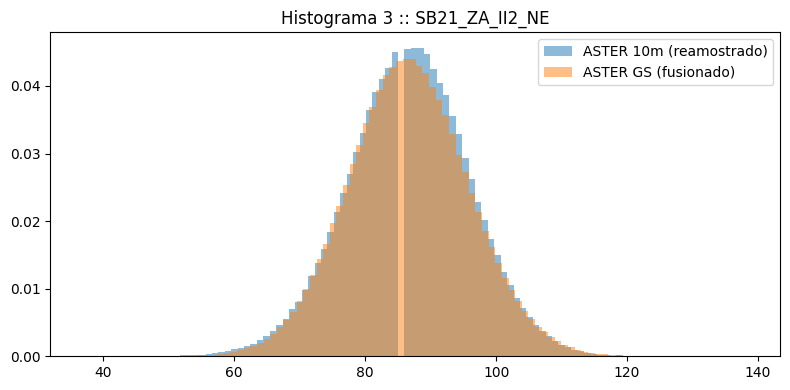

4        corr=0.6381  RMSE=  1.3259  bias=  0.0001


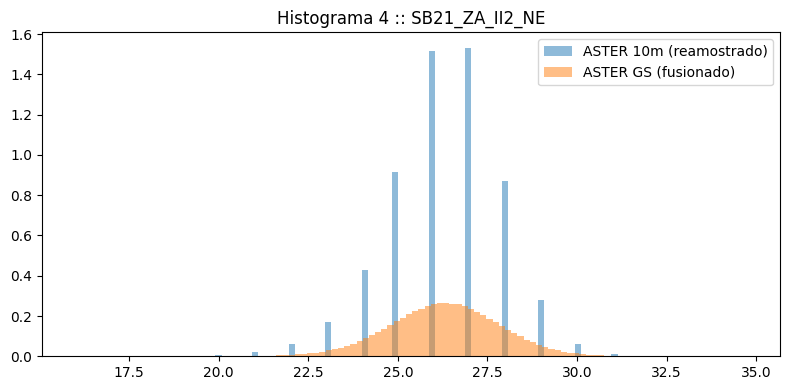

5        corr=0.6776  RMSE=  0.8489  bias=  0.0001


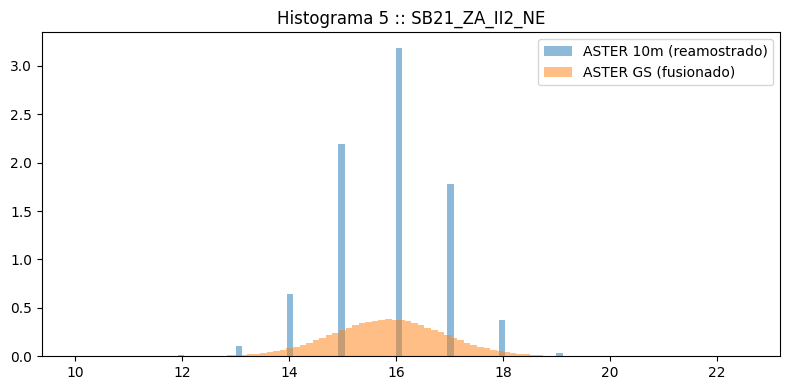

6        corr=0.7671  RMSE=  0.8115  bias=  0.0001


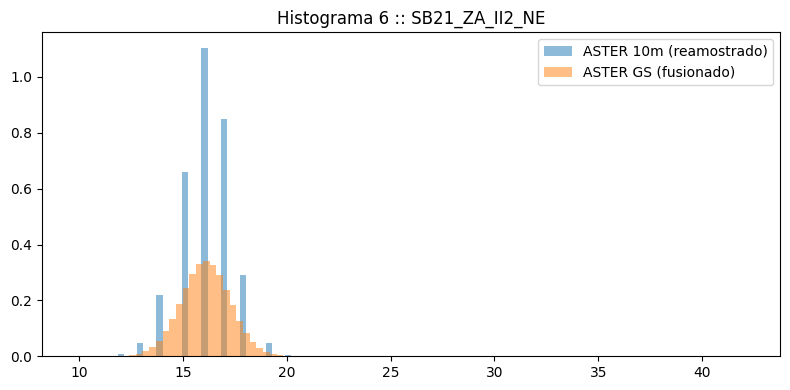

7        corr=0.9398  RMSE=  0.3391  bias=  0.0000


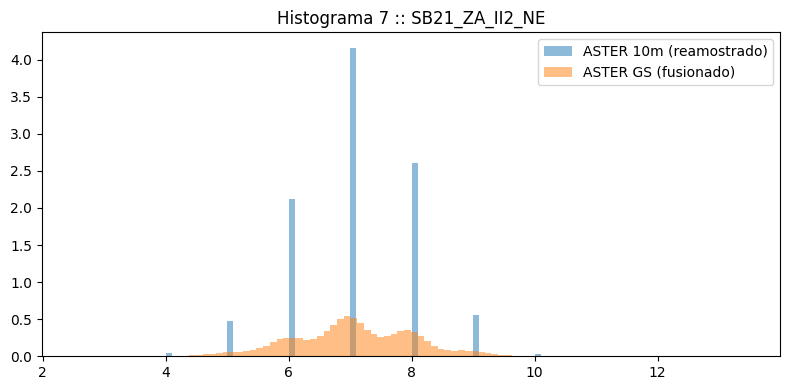

8        corr=0.8582  RMSE=  0.4251  bias=  0.0000


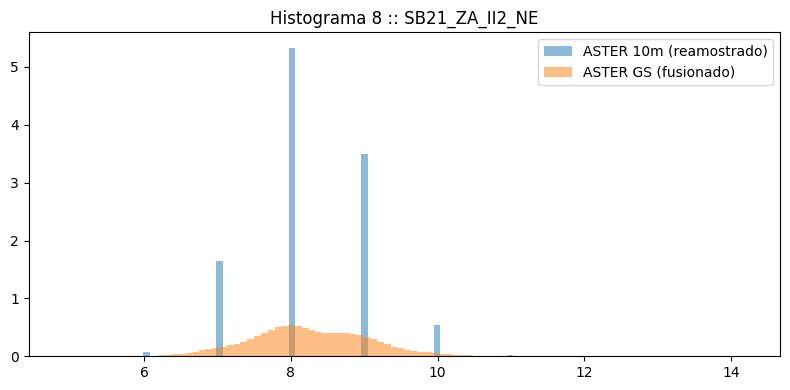

9        corr=0.4478  RMSE=  0.7685  bias=  0.0001


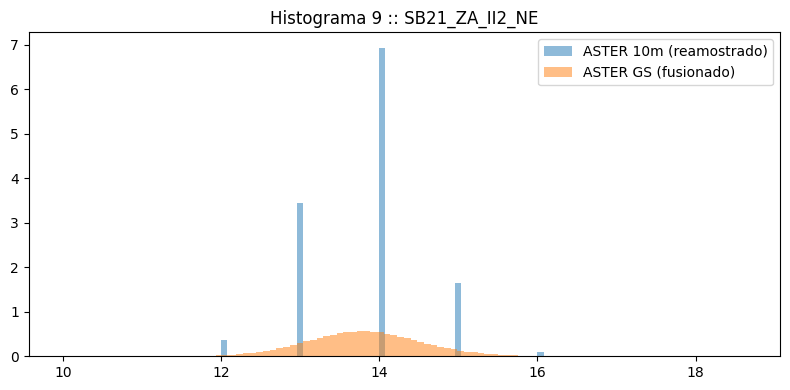

In [4]:
import numpy as np
import xarray as xr
import rioxarray
import matplotlib.pyplot as plt

def load_aster_pair(folha_codigo: str):
    base_dir = "./recortes_orbitais"
    aster_ms_path = os.path.join(
        base_dir,
        f"{folha_codigo}_ASTER_AST_L1T_00307292004141220_20150505110335_VNIR_SWIR_10m.tif",
    )
    aster_gs_path = os.path.join(
        base_dir,
        f"{folha_codigo}_ASTER_AST_L1T_00307292004141220_20150505110335_VNIR_SWIR_GS_10m.tif",
    )

    aster_ms = rioxarray.open_rasterio(aster_ms_path, masked=True).astype("float32")
    aster_gs = rioxarray.open_rasterio(aster_gs_path, masked=True).astype("float32")

    # Garante que têm a mesma grade (devem ter, mas não custa)
    aster_gs = aster_gs.rio.reproject_match(aster_ms)

    return aster_ms, aster_gs

def analyse_aster_ms_vs_gs(folha_codigo: str):
    print(f"\n=== Análise ASTER MS vs GS :: {folha_codigo} ===")
    aster_ms, aster_gs = load_aster_pair(folha_codigo)

    band_names = [str(b) for b in aster_ms.band.values]

    for i, bname in enumerate(band_names):
        ms = aster_ms.isel(band=i).values
        gs = aster_gs.isel(band=i).values

        mask = np.isfinite(ms) & np.isfinite(gs)
        if mask.sum() == 0:
            print(f"{bname}: sem pixels válidos.")
            continue

        v_ms = ms[mask]
        v_gs = gs[mask]

        corr = np.corrcoef(v_ms, v_gs)[0, 1]
        rmse = np.sqrt(np.mean((v_gs - v_ms)**2))
        bias = np.mean(v_gs - v_ms)

        print(f"{bname:7s}  corr={corr:6.4f}  RMSE={rmse:8.4f}  bias={bias:8.4f}")

        # Histograma comparativo
        plt.figure(figsize=(8,4))
        plt.hist(v_ms, bins=100, alpha=0.5, density=True, label="ASTER 10m (reamostrado)")
        plt.hist(v_gs, bins=100, alpha=0.5, density=True, label="ASTER GS (fusionado)")
        plt.title(f"Histograma {bname} :: {folha_codigo}")
        plt.legend()
        plt.tight_layout()
        plt.show()

# Rodar para NW e NE, por exemplo:
analyse_aster_ms_vs_gs("SB21_ZA_II2_NW")
analyse_aster_ms_vs_gs("SB21_ZA_II2_NE")



=== Detalhe espacial vs B08 :: SB21_ZA_II2_NW ===


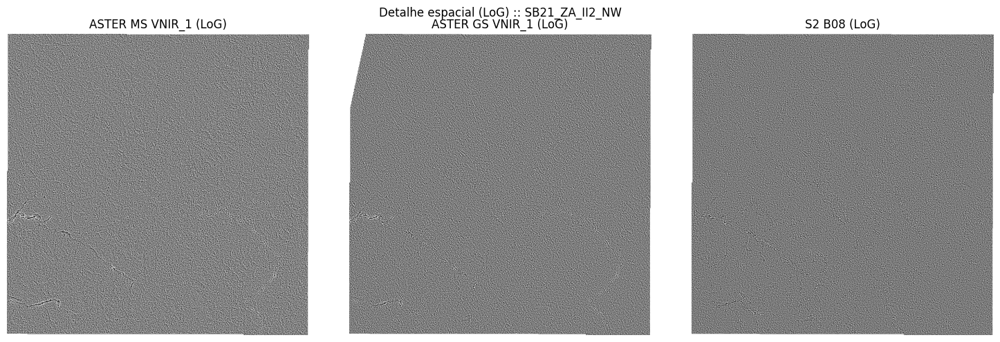


=== Detalhe espacial vs B08 :: SB21_ZA_II2_NE ===


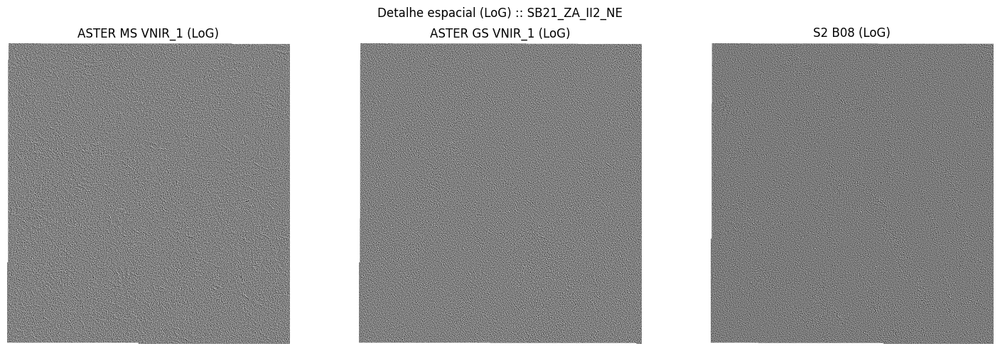

In [5]:
import os
import numpy as np
import rioxarray
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_laplace

def load_s2_stack(folha_codigo: str):
    base_dir = "./recortes_orbitais"
    # Atenção: o nome do arquivo S2 tem o ID no meio; usa um glob simples:
    import glob
    pattern = os.path.join(base_dir, f"{folha_codigo}_S2_*_stack.tif")
    matches = glob.glob(pattern)
    if not matches:
        raise FileNotFoundError(f"Nenhum stack S2 encontrado para {folha_codigo}")
    s2_path = matches[0]
    s2_stack = rioxarray.open_rasterio(s2_path, masked=True).astype("float32")
    return s2_stack

def compare_spatial_detail(folha_codigo: str, band_vnir_name: str = "VNIR_1"):
    print(f"\n=== Detalhe espacial vs B08 :: {folha_codigo} ===")
    aster_ms, aster_gs = load_aster_pair(folha_codigo)
    s2_stack = load_s2_stack(folha_codigo)

    # Seleciona B08 do S2
    # s2_stack.band tem nomes ["B02","B03",...]. Se for 1..10, ajuste.
    try:
        idx_b08 = list(s2_stack.band.values).index("B08")
    except ValueError:
        # fallback se band for 1..n:
        idx_b08 = 6  # posição de B08 se a ordem for B02..B12
    s2_b08 = s2_stack.isel(band=idx_b08)

    # Reprojetar B08 na grade do ASTER
    s2_b08_match = s2_b08.rio.reproject_match(aster_ms)

    # Seleciona uma banda VNIR do ASTER
    band_names = list(aster_ms.band.values)
    try:
        idx_vnir = band_names.index(band_vnir_name)
    except ValueError:
        idx_vnir = 0  # se nome não existir, usa primeira banda
    ms_vnir = aster_ms.isel(band=idx_vnir)
    gs_vnir = aster_gs.isel(band=idx_vnir)

    # Operador Laplaciano-of-Gaussian (ressalta detalhe)
    def log_filter(da, sigma=1.0):
        arr = da.values.astype("float32")
        return gaussian_laplace(arr, sigma=sigma)

    ms_log = log_filter(ms_vnir)
    gs_log = log_filter(gs_vnir)
    b08_log = log_filter(s2_b08_match)

    # Normaliza para visualização comparável
    def normalize(a):
        v = a[np.isfinite(a)]
        if v.size == 0:
            return np.zeros_like(a)
        vmin, vmax = np.percentile(v, [2, 98])
        s = vmax - vmin if vmax > vmin else 1.0
        return np.clip((a - vmin) / s, 0, 1)

    ms_vis  = normalize(ms_log)
    gs_vis  = normalize(gs_log)
    b08_vis = normalize(b08_log)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(ms_vis, cmap="gray")
    axs[0].set_title(f"ASTER MS {band_vnir_name} (LoG)")
    axs[0].axis("off")

    axs[1].imshow(gs_vis, cmap="gray")
    axs[1].set_title(f"ASTER GS {band_vnir_name} (LoG)")
    axs[1].axis("off")

    axs[2].imshow(b08_vis, cmap="gray")
    axs[2].set_title("S2 B08 (LoG)")
    axs[2].axis("off")

    plt.suptitle(f"Detalhe espacial (LoG) :: {folha_codigo}")
    plt.tight_layout()
    plt.show()

# Exemplo:
compare_spatial_detail("SB21_ZA_II2_NW", band_vnir_name="VNIR_1")
compare_spatial_detail("SB21_ZA_II2_NE", band_vnir_name="VNIR_1")


In [6]:
import glob
import rioxarray

def build_supercube(folha_codigo: str):
    base_dir = "./recortes_orbitais"

    # S2 stack
    s2_pattern = os.path.join(base_dir, f"{folha_codigo}_S2_*_stack.tif")
    s2_path = glob.glob(s2_pattern)[0]
    s2_stack = rioxarray.open_rasterio(s2_path, masked=True).astype("float32")

    # ASTER GS
    aster_gs_path = os.path.join(
        base_dir,
        f"{folha_codigo}_ASTER_AST_L1T_00307292004141220_20150505110335_VNIR_SWIR_GS_10m.tif",
    )
    aster_gs = rioxarray.open_rasterio(aster_gs_path, masked=True).astype("float32")
    aster_gs = aster_gs.rio.reproject_match(s2_stack)

    # Nomes das bandas
    s2_names    = [str(b) for b in s2_stack.band.values]
    aster_names = [str(b) for b in aster_gs.band.values]
    super_names = s2_names + aster_names

    super_cube = xr.concat([s2_stack, aster_gs], dim="band")
    super_cube = super_cube.assign_coords(band=("band", super_names))

    # Máscara: excluir pixels com NaN em qualquer banda (opcional e conservador)
    arr = super_cube.values
    valid = np.isfinite(arr).all(axis=0)
    super_cube = super_cube.where(valid)

    out_tif = os.path.join(
        base_dir,
        f"{folha_codigo}_S2_ASTER_GS_supercube_10m.tif"
    )
    super_cube.rio.to_raster(out_tif)
    print("Super-cubo salvo em:", out_tif)

    return super_cube

# Exemplo:
super_NW = build_supercube("SB21_ZA_II2_NW")
super_NE = build_supercube("SB21_ZA_II2_NE")


Super-cubo salvo em: ./recortes_orbitais/SB21_ZA_II2_NW_S2_ASTER_GS_supercube_10m.tif
Super-cubo salvo em: ./recortes_orbitais/SB21_ZA_II2_NE_S2_ASTER_GS_supercube_10m.tif


In [7]:
#!/usr/bin/env python
from __future__ import annotations

import os
from typing import Tuple, Dict

import numpy as np
import xarray as xr
import rioxarray
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from sqlalchemy import create_engine, text

# ----------------------------------------------------------------------
# CONFIGURAÇÕES
# ----------------------------------------------------------------------
PG_USER = "postgres"
PG_PASS = "postgres"
PG_HOST = "localhost"
PG_PORT = "5432"
PG_DB   = "geologia"

PG_CONN_STR = (
    f"postgresql+psycopg2://{PG_USER}:{PG_PASS}@{PG_HOST}:{PG_PORT}/{PG_DB}"
)

# Diretório onde estão os rasters processados pelo pipeline GS
RASTER_DIR = "./recortes_orbitais"

# Nome da folha alvo
FOLHA_CODIGO = "SB21_ZA_II2_NW"

# ID do ASTER, usado no nome dos arquivos
ASTER_ID = "AST_L1T_00307292004141220_20150505110335"

# ID do Sentinel-2, usado no nome dos arquivos
S2_ID = "S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213"

# Saída do dataset
OUT_DATASET = f"./dataset_pixels_{FOLHA_CODIGO}.npz"

# Número máximo opcional de amostras por classe (None = usar todos os pixels)
MAX_SAMPLES_PER_CLASS = 50000


# ----------------------------------------------------------------------
# FUNÇÕES AUXILIARES
# ----------------------------------------------------------------------
def load_supercube(folha_codigo: str) -> xr.DataArray:
    """
    Carrega o super-cubo S2 + ASTER_GS para a folha especificada.

    Se você já tiver um super-cubo salvo, use diretamente.
    Aqui vou concatenar S2_stack + ASTER_GS, como no passo anterior.
    """
    # Sentinel-2 stack
    s2_stack_path = os.path.join(
        RASTER_DIR,
        f"{folha_codigo}_S2_{S2_ID}_stack.tif",
    )
    s2_stack = rioxarray.open_rasterio(s2_stack_path, masked=True).astype("float32")

    # ASTER GS
    aster_gs_path = os.path.join(
        RASTER_DIR,
        f"{folha_codigo}_ASTER_{ASTER_ID}_VNIR_SWIR_GS_10m.tif",
    )
    aster_gs = rioxarray.open_rasterio(aster_gs_path, masked=True).astype("float32")

    # Garante mesma grade
    aster_gs = aster_gs.rio.reproject_match(s2_stack)

    # Nomes das bandas
    s2_names    = [str(b) for b in s2_stack.band.values]
    aster_names = [str(b) for b in aster_gs.band.values]
    super_names = s2_names + aster_names

    super_cube = xr.concat([s2_stack, aster_gs], dim="band")
    super_cube = super_cube.assign_coords(band=("band", super_names))

    # Opcional: garantir CRS e transform no super-cubo
    super_cube.rio.write_crs(s2_stack.rio.crs, inplace=True)
    super_cube.rio.write_transform(s2_stack.rio.transform(), inplace=True)

    return super_cube


def get_litologia_100k_for_folha(
    folha_codigo: str,
    raster_crs,
) -> gpd.GeoDataFrame:
    """
    Busca, no PostGIS, as unidades da litologia_100k que intersectam a folha
    e reprojeta para o CRS do raster.
    """
    engine = create_engine(PG_CONN_STR)

    # Busca os polígonos de litologia que intersectam a folha (em CRS original da tabela)
    sql = """
    SELECT
        id_unidade::integer AS label,
        geom
    FROM litologia.litologia_100k
    WHERE ST_Intersects(
        geom,
        (SELECT geom
         FROM carto.folhas_cartograficas
         WHERE codigo = %(codigo)s
         LIMIT 1)
    );
    """

    gdf = gpd.read_postgis(
        sql,
        con=engine,
        geom_col="geom",
        params={"codigo": folha_codigo},
    )

    if gdf.empty:
        raise RuntimeError(f"Nenhuma unidade litológica encontrada para a folha {folha_codigo}.")

    # Reprojetar para o CRS do raster
    gdf = gdf.to_crs(raster_crs)

    return gdf


def rasterize_litologia(
    gdf_lito: gpd.GeoDataFrame,
    reference_da: xr.DataArray,
    background_label: int = 0,
) -> np.ndarray:
    """
    Rasteriza os polígonos de litologia na grade do raster de referência.

    Retorna um array 2D (height, width) com labels inteiros.
    background_label = 0 será usado para pixels sem litologia (fora de polígono).
    """
    height = reference_da.sizes["y"]
    width  = reference_da.sizes["x"]
    transform = reference_da.rio.transform()

    # (geom, label) para rasterize
    shapes = [
        (geom, int(label))
        for geom, label in zip(gdf_lito.geometry, gdf_lito["label"])
        if geom is not None
    ]

    label_raster = rasterize(
        shapes=shapes,
        out_shape=(height, width),
        transform=transform,
        fill=background_label,
        dtype="int32",
        all_touched=False,  # mais conservador
    )

    return label_raster


def extract_pixel_dataset(
    super_cube: xr.DataArray,
    label_raster: np.ndarray,
    max_samples_per_class: int | None = None,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Extrai X (espectro por pixel) e y (classe litológica) a partir do super-cubo
    e do raster de labels.

    - super_cube: DataArray (band, y, x) com bandas S2+ASTER_GS.
    - label_raster: array 2D (y, x) com rótulos inteiros (0 = sem rótulo).

    Se max_samples_per_class não for None, faz amostragem balanceada.
    """
    data = super_cube.values  # shape: (C, H, W)
    C, H, W = data.shape

    labels_flat = label_raster.reshape(-1)        # (H*W,)
    data_flat   = data.reshape(C, -1).T           # (H*W, C)

    # Máscara: descartar pixels sem rótulo (label == 0)
    mask = labels_flat != 0

    # Máscara de NaNs no espectro
    mask &= np.isfinite(data_flat).all(axis=1)

    X_all = data_flat[mask]  # (Npix, C)
    y_all = labels_flat[mask]

    if max_samples_per_class is None:
        return X_all.astype("float32"), y_all.astype("int64")

    # Amostragem balanceada por classe
    X_list = []
    y_list = []
    classes = np.unique(y_all)
    for cls in classes:
        idx_cls = np.where(y_all == cls)[0]
        if idx_cls.size == 0:
            continue
        if idx_cls.size > max_samples_per_class:
            idx_sel = np.random.choice(
                idx_cls,
                size=max_samples_per_class,
                replace=False,
            )
        else:
            idx_sel = idx_cls
        X_list.append(X_all[idx_sel])
        y_list.append(y_all[idx_sel])

    X = np.vstack(X_list).astype("float32")
    y = np.concatenate(y_list).astype("int64")

    return X, y


# ----------------------------------------------------------------------
# MAIN
# ----------------------------------------------------------------------
def main():
    print("=" * 80)
    print(f"[DATASET PIXELS] Folha alvo: {FOLHA_CODIGO}")
    print("=" * 80)

    # 1) Carrega super-cubo (S2 + ASTER_GS)
    super_cube = load_supercube(FOLHA_CODIGO)
    print(f"[INFO] Super-cubo carregado. Shape = {super_cube.values.shape}")
    print(f"       Bandas = {list(super_cube.band.values)}")
    print(f"       CRS    = {super_cube.rio.crs}")

    # 2) Busca litologia_100k da folha, no CRS do raster
    gdf_lito = get_litologia_100k_for_folha(
        folha_codigo=FOLHA_CODIGO,
        raster_crs=super_cube.rio.crs,
    )
    print(f"[INFO] Unidades litológicas encontradas: {len(gdf_lito)}")

    # 3) Rasteriza litologia na grade do super-cubo
    label_raster = rasterize_litologia(
        gdf_lito=gdf_lito,
        reference_da=super_cube,
        background_label=0,
    )
    print(f"[INFO] Raster de labels gerado. Shape = {label_raster.shape}")

    # 4) Extrai dataset pixel-wise
    X, y = extract_pixel_dataset(
        super_cube=super_cube,
        label_raster=label_raster,
        max_samples_per_class=MAX_SAMPLES_PER_CLASS,
    )
    print(f"[INFO] Dataset extraído: X.shape={X.shape}, y.shape={y.shape}")
    print(f"[INFO] Número de classes = {np.unique(y).size}")

    # 5) Salva em npz
    np.savez_compressed(
        OUT_DATASET,
        X=X,
        y=y,
        bands=np.array(list(super_cube.band.values)),
    )
    print(f"[OUTPUT] Dataset salvo em: {OUT_DATASET}")


if __name__ == "__main__":
    main()


[DATASET PIXELS] Folha alvo: SB21_ZA_II2_NW
[INFO] Super-cubo carregado. Shape = (19, 1384, 1385)
       Bandas = [np.str_('1'), np.str_('2'), np.str_('3'), np.str_('4'), np.str_('5'), np.str_('6'), np.str_('7'), np.str_('8'), np.str_('9'), np.str_('10'), np.str_('1'), np.str_('2'), np.str_('3'), np.str_('4'), np.str_('5'), np.str_('6'), np.str_('7'), np.str_('8'), np.str_('9')]
       CRS    = EPSG:32721
[INFO] Unidades litológicas encontradas: 5
[INFO] Raster de labels gerado. Shape = (1384, 1385)
[INFO] Dataset extraído: X.shape=(200000, 19), y.shape=(200000,)
[INFO] Número de classes = 4
[OUTPUT] Dataset salvo em: ./dataset_pixels_SB21_ZA_II2_NW.npz


In [8]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader

class PixelSpectralDataset(Dataset):
    def __init__(self, npz_path: str):
        data = np.load(npz_path)
        self.X = data["X"].astype("float32")   # (N, C)
        self.y = data["y"].astype("int64")    # (N,)

        # Normalização simples por banda (média 0, desvio 1)
        self.mean = self.X.mean(axis=0, keepdims=True)
        self.std  = self.X.std(axis=0, keepdims=True)
        self.std[self.std == 0] = 1.0
        self.X = (self.X - self.mean) / self.std

        self.C = self.X.shape[1]

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        x = self.X[idx]        # (C,)
        y = self.y[idx]        # escalar

        # Formato (C, 1, 1) para conv2d
        x = torch.from_numpy(x).view(self.C, 1, 1)
        y = torch.tensor(y, dtype=torch.long)

        return x, y


In [9]:
import torch.nn as nn

class PixelCNN(nn.Module):
    """
    CNN 1x1: convoluções espaciais de 1x1, equivalente a MLP por pixel,
    mas escrita em forma de conv2d.
    """
    def __init__(self, in_channels: int, n_classes: int):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(64, n_classes, kernel_size=1),
        )

    def forward(self, x):
        # x: (B, C, 1, 1)
        out = self.net(x)           # (B, n_classes, 1, 1)
        out = out.view(out.size(0), out.size(1))  # (B, n_classes)
        return out


In [10]:
import torch
from torch.utils.data import random_split

# Carrega dataset
full_ds = PixelSpectralDataset("./dataset_pixels_SB21_ZA_II2_NE.npz")

n_classes = int(full_ds.y.max() + 1)  # se labels forem 1..K; ajuste se tiver buracos
in_channels = full_ds.C

# Split treino/val
n_total = len(full_ds)
n_train = int(0.8 * n_total)
n_val   = n_total - n_train
train_ds, val_ds = random_split(full_ds, [n_train, n_val])

train_loader = DataLoader(train_ds, batch_size=512, shuffle=True, num_workers=4)
val_loader   = DataLoader(val_ds,   batch_size=512, shuffle=False, num_workers=4)

# Modelo, loss, otimizador
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = PixelCNN(in_channels=in_channels, n_classes=n_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

for epoch in range(1, 26):
    # Treino
    model.train()
    running_loss = 0.0
    for X_batch, y_batch in train_loader:
        X_batch = X_batch.to(device)   # (B, C, 1, 1)
        y_batch = y_batch.to(device)   # (B,)

        optimizer.zero_grad()
        logits = model(X_batch)        # (B, n_classes)
        loss = criterion(logits, y_batch)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X_batch.size(0)

    train_loss = running_loss / n_train

    # Validação
    model.eval()
    correct = 0
    total   = 0
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            logits  = model(X_batch)
            preds   = logits.argmax(dim=1)
            correct += (preds == y_batch).sum().item()
            total   += y_batch.size(0)

    val_acc = correct / total if total > 0 else 0.0
    print(f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | val_acc={val_acc:.4f}")


Epoch 01 | train_loss=2.1489 | val_acc=0.4146
Epoch 02 | train_loss=1.2961 | val_acc=0.4516
Epoch 03 | train_loss=1.2506 | val_acc=0.4565
Epoch 04 | train_loss=1.2346 | val_acc=0.4645
Epoch 05 | train_loss=1.2242 | val_acc=0.4687
Epoch 06 | train_loss=1.2165 | val_acc=0.4703
Epoch 07 | train_loss=1.2104 | val_acc=0.4721
Epoch 08 | train_loss=1.2055 | val_acc=0.4726
Epoch 09 | train_loss=1.2023 | val_acc=0.4778
Epoch 10 | train_loss=1.1983 | val_acc=0.4776
Epoch 11 | train_loss=1.1946 | val_acc=0.4793
Epoch 12 | train_loss=1.1903 | val_acc=0.4842
Epoch 13 | train_loss=1.1855 | val_acc=0.4842
Epoch 14 | train_loss=1.1811 | val_acc=0.4835
Epoch 15 | train_loss=1.1786 | val_acc=0.4886
Epoch 16 | train_loss=1.1769 | val_acc=0.4881
Epoch 17 | train_loss=1.1749 | val_acc=0.4925
Epoch 18 | train_loss=1.1733 | val_acc=0.4923
Epoch 19 | train_loss=1.1728 | val_acc=0.4931
Epoch 20 | train_loss=1.1718 | val_acc=0.4920
Epoch 21 | train_loss=1.1702 | val_acc=0.4931
Epoch 22 | train_loss=1.1697 | val

In [11]:
#!/usr/bin/env python
from __future__ import annotations

import os
from typing import Tuple

import numpy as np
import xarray as xr
import rioxarray
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from sqlalchemy import create_engine

# ----------------------------------------------------------------------
# CONFIGURAÇÕES
# ----------------------------------------------------------------------
PG_USER = "postgres"
PG_PASS = "postgres"
PG_HOST = "localhost"
PG_PORT = "5432"
PG_DB   = "geologia"

PG_CONN_STR = (
    f"postgresql+psycopg2://{PG_USER}:{PG_PASS}@{PG_HOST}:{PG_PORT}/{PG_DB}"
)

RASTER_DIR = "./recortes_orbitais"

FOLHA_CODIGO = "SB21_ZA_II2_NW"

ASTER_ID = "AST_L1T_00307292004141220_20150505110335"
S2_ID    = "S2B_MSIL2A_20230703T140709_R110_T21MWP_20241013T181213"

# Tamanho da janela e stride
PATCH_SIZE = 32        # 32x32 pixels
STRIDE     = 16        # passo do sliding window

# Quantidade máxima opcional de patches por classe
MAX_PATCHES_PER_CLASS = 5000

OUT_DATASET_PATCH = (
    f"./dataset_patches_{FOLHA_CODIGO}_ps{PATCH_SIZE}_st{STRIDE}.npz"
)


# ----------------------------------------------------------------------
# FUNÇÕES AUXILIARES
# ----------------------------------------------------------------------
def load_supercube(folha_codigo: str) -> xr.DataArray:
    """
    Carrega super-cubo S2 stack + ASTER_GS para a folha.
    """
    s2_stack_path = os.path.join(
        RASTER_DIR,
        f"{folha_codigo}_S2_{S2_ID}_stack.tif",
    )
    s2_stack = rioxarray.open_rasterio(s2_stack_path, masked=True).astype("float32")

    aster_gs_path = os.path.join(
        RASTER_DIR,
        f"{folha_codigo}_ASTER_{ASTER_ID}_VNIR_SWIR_GS_10m.tif",
    )
    aster_gs = rioxarray.open_rasterio(aster_gs_path, masked=True).astype("float32")
    aster_gs = aster_gs.rio.reproject_match(s2_stack)

    s2_names    = [str(b) for b in s2_stack.band.values]
    aster_names = [str(b) for b in aster_gs.band.values]
    super_names = s2_names + aster_names

    super_cube = xr.concat([s2_stack, aster_gs], dim="band")
    super_cube = super_cube.assign_coords(band=("band", super_names))

    super_cube.rio.write_crs(s2_stack.rio.crs, inplace=True)
    super_cube.rio.write_transform(s2_stack.rio.transform(), inplace=True)

    return super_cube


def get_litologia_100k_for_folha(
    folha_codigo: str,
    raster_crs,
) -> gpd.GeoDataFrame:
    """
    Busca litologia_100k que intersecta a folha e reprojeta para o CRS do raster.
    """
    engine = create_engine(PG_CONN_STR)

    sql = """
    SELECT
        id_unidade::integer AS label,
        geom
    FROM litologia.litologia_100k
    WHERE ST_Intersects(
        geom,
        (SELECT geom
         FROM carto.folhas_cartograficas
         WHERE codigo = %(codigo)s
         LIMIT 1)
    );
    """

    gdf = gpd.read_postgis(
        sql,
        con=engine,
        geom_col="geom",
        params={"codigo": folha_codigo},
    )
    if gdf.empty:
        raise RuntimeError(f"Nenhuma unidade litológica para {folha_codigo}.")

    gdf = gdf.to_crs(raster_crs)
    return gdf


def rasterize_litologia(
    gdf_lito: gpd.GeoDataFrame,
    reference_da: xr.DataArray,
    background_label: int = 0,
) -> np.ndarray:
    """
    Rasteriza litologia na grade do super-cubo.
    """
    height = reference_da.sizes["y"]
    width  = reference_da.sizes["x"]
    transform = reference_da.rio.transform()

    shapes = [
        (geom, int(label))
        for geom, label in zip(gdf_lito.geometry, gdf_lito["label"])
        if geom is not None
    ]

    label_raster = rasterize(
        shapes=shapes,
        out_shape=(height, width),
        transform=transform,
        fill=background_label,
        dtype="int32",
        all_touched=False,
    )
    return label_raster


def generate_patches(
    super_cube: xr.DataArray,
    label_raster: np.ndarray,
    patch_size: int = 32,
    stride: int = 16,
    max_patches_per_class: int | None = None,
) -> tuple[np.ndarray, np.ndarray]:
    """
    Gera patches (C, H, W) e rótulo por patch usando o rótulo do pixel central.
    """
    data = super_cube.values   # (C, H, W)
    C, H, W = data.shape

    if label_raster.shape != (H, W):
        raise ValueError("label_raster e super_cube têm shapes incompatíveis.")

    half = patch_size // 2

    patches = []
    labels  = []

    # sliding window sobre o raster
    for cy in range(half, H - half, stride):
        for cx in range(half, W - half, stride):
            center_label = int(label_raster[cy, cx])
            # pula pixels sem rótulo
            if center_label == 0:
                continue

            patch = data[:, cy - half : cy + half, cx - half : cx + half]

            # descarta patches com NaN em qualquer banda
            if not np.isfinite(patch).all():
                continue

            patches.append(patch)
            labels.append(center_label)

    patches = np.stack(patches, axis=0)  # (N, C, ps, ps)
    labels  = np.array(labels, dtype="int32")

    print(f"[INFO] Total bruto de patches = {patches.shape[0]}")

    if max_patches_per_class is None:
        return patches, labels

    # amostragem balanceada por classe
    X_list = []
    y_list = []
    classes = np.unique(labels)
    for cls in classes:
        idx_cls = np.where(labels == cls)[0]
        if idx_cls.size == 0:
            continue
        if idx_cls.size > max_patches_per_class:
            idx_sel = np.random.choice(
                idx_cls,
                size=max_patches_per_class,
                replace=False,
            )
        else:
            idx_sel = idx_cls
        X_list.append(patches[idx_sel])
        y_list.append(labels[idx_sel])

    X = np.concatenate(X_list, axis=0)
    y = np.concatenate(y_list, axis=0)

    return X, y


# ----------------------------------------------------------------------
# MAIN
# ----------------------------------------------------------------------
def main():
    print("=" * 80)
    print(f"[DATASET PATCHES] Folha alvo: {FOLHA_CODIGO}")
    print("=" * 80)

    super_cube = load_supercube(FOLHA_CODIGO)
    print(f"[INFO] Super-cubo shape = {super_cube.shape}")
    print(f"[INFO] Bandas = {list(super_cube.band.values)}")
    print(f"[INFO] CRS    = {super_cube.rio.crs}")

    gdf_lito = get_litologia_100k_for_folha(
        folha_codigo=FOLHA_CODIGO,
        raster_crs=super_cube.rio.crs,
    )
    print(f"[INFO] Unidades litológicas = {len(gdf_lito)}")

    label_raster = rasterize_litologia(
        gdf_lito=gdf_lito,
        reference_da=super_cube,
        background_label=0,
    )
    print(f"[INFO] Raster de labels shape = {label_raster.shape}")

    X, y = generate_patches(
        super_cube=super_cube,
        label_raster=label_raster,
        patch_size=PATCH_SIZE,
        stride=STRIDE,
        max_patches_per_class=MAX_PATCHES_PER_CLASS,
    )
    print(f"[INFO] Dataset de patches: X.shape={X.shape}, y.shape={y.shape}")
    print(f"[INFO] Classes únicas = {np.unique(y)}")

    np.savez_compressed(
        OUT_DATASET_PATCH,
        X=X.astype("float32"),
        y=y.astype("int64"),
        bands=np.array(list(super_cube.band.values)),
        patch_size=np.array([PATCH_SIZE]),
        stride=np.array([STRIDE]),
    )
    print(f"[OUTPUT] Dataset de patches salvo em: {OUT_DATASET_PATCH}")


if __name__ == "__main__":
    main()


[DATASET PATCHES] Folha alvo: SB21_ZA_II2_NW
[INFO] Super-cubo shape = (19, 1384, 1385)
[INFO] Bandas = [np.str_('1'), np.str_('2'), np.str_('3'), np.str_('4'), np.str_('5'), np.str_('6'), np.str_('7'), np.str_('8'), np.str_('9'), np.str_('10'), np.str_('1'), np.str_('2'), np.str_('3'), np.str_('4'), np.str_('5'), np.str_('6'), np.str_('7'), np.str_('8'), np.str_('9')]
[INFO] CRS    = EPSG:32721
[INFO] Unidades litológicas = 5
[INFO] Raster de labels shape = (1384, 1385)
[INFO] Total bruto de patches = 7048
[INFO] Dataset de patches: X.shape=(7048, 19, 32, 32), y.shape=(7048,)
[INFO] Classes únicas = [1316 1327 1362 3871]
[OUTPUT] Dataset de patches salvo em: ./dataset_patches_SB21_ZA_II2_NW_ps32_st16.npz


In [12]:
import numpy as np
import torch
from torch.utils.data import Dataset

class PatchDataset(Dataset):
    def __init__(self, npz_path: str):
        data = np.load(npz_path)
        self.X = data["X"].astype("float32")   # (N, C, H, W)
        self.y = data["y"].astype("int64")    # (N,)

        self.N, self.C, self.H, self.W = self.X.shape

        # mapeia labels originais (id_unidade) -> índices 0..K-1
        classes = np.unique(self.y)
        self.classes      = classes
        self.label_to_idx = {lab: i for i, lab in enumerate(classes)}
        self.idx_to_label = {i: lab for i, lab in enumerate(classes)}

        # converte labels para 0..K-1
        self.y = np.vectorize(self.label_to_idx.get)(self.y)

        # normalização por canal (C) global
        # achatamos H e W para calcular média/desvio por canal
        X_flat = self.X.reshape(self.N, self.C, -1)  # (N, C, H*W)

        # média e desvio ao longo de N e dos pixels (H*W)
        mean = X_flat.mean(axis=(0, 2))  # (C,)
        std  = X_flat.std(axis=(0, 2))   # (C,)
        std[std == 0] = 1.0

        # reshape para broadcast em (N, C, H, W)
        mean = mean.reshape(1, self.C, 1, 1)  # (1, C, 1, 1)
        std  = std.reshape(1, self.C, 1, 1)   # (1, C, 1, 1)

        self.X = (self.X - mean) / std

    def __len__(self):
        return self.N

    def __getitem__(self, idx):
        x = torch.from_numpy(self.X[idx])               # (C, H, W)
        y = torch.tensor(self.y[idx], dtype=torch.long) # escalar
        return x, y


In [13]:
import torch.nn as nn

class PatchCNN(nn.Module):
    def __init__(self, in_channels: int, n_classes: int):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),       # 32 -> 16

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),       # 16 -> 8

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),       # 8 -> 4
        )

        self.pool = nn.AdaptiveAvgPool2d(1)  # (B, 256, 1, 1)
        self.classifier = nn.Linear(256, n_classes)

    def forward(self, x):
        # x: (B, C, H, W)
        z = self.features(x)        # (B, 256, H', W')
        z = self.pool(z)            # (B, 256, 1, 1)
        z = z.view(z.size(0), -1)   # (B, 256)
        logits = self.classifier(z) # (B, n_classes)
        return logits


In [14]:
NPZ_PATCHES = "./dataset_patches_SB21_ZA_II2_NW_ps32_st16.npz"
full_ds = PatchDataset(NPZ_PATCHES)


In [15]:
import torch
from torch.utils.data import DataLoader, random_split
import torch.nn as nn

# Caminho para o dataset de patches gerado no script anterior
NPZ_PATCHES = "./dataset_patches_SB21_ZA_II2_NW_ps32_st16.npz"

# 1) Dataset PyTorch
full_ds = PatchDataset(NPZ_PATCHES)
n_classes   = len(full_ds.classes)
in_channels = full_ds.C

print("Número de amostras:", len(full_ds))
print("Bandas (C):", in_channels)
print("Classes:", full_ds.classes)

# 2) Split treino/val
n_total = len(full_ds)
n_train = int(0.8 * n_total)
n_val   = n_total - n_train

train_ds, val_ds = random_split(full_ds, [n_train, n_val])

train_loader = DataLoader(train_ds, batch_size=64, shuffle=True,  num_workers=4)
val_loader   = DataLoader(val_ds,   batch_size=64, shuffle=False, num_workers=4)

# 3) Modelo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model  = PatchCNN(in_channels=in_channels, n_classes=n_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)

# 4) Treino
for epoch in range(1, 21):
    # fase de treino
    model.train()
    running_loss = 0.0
    for X_batch, y_batch in train_loader:
        X_batch = X_batch.to(device)   # (B, C, H, W)
        y_batch = y_batch.to(device)   # (B,)

        optimizer.zero_grad()
        logits = model(X_batch)
        loss   = criterion(logits, y_batch)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X_batch.size(0)

    train_loss = running_loss / n_train

    # fase de validação
    model.eval()
    correct = 0
    total   = 0
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            logits  = model(X_batch)
            preds   = logits.argmax(dim=1)
            correct += (preds == y_batch).sum().item()
            total   += y_batch.size(0)

    val_acc = correct / total if total > 0 else 0.0
    print(f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | val_acc={val_acc:.4f}")


Número de amostras: 7048
Bandas (C): 19
Classes: [1316 1327 1362 3871]
Epoch 01 | train_loss=0.9043 | val_acc=0.6191
Epoch 02 | train_loss=0.7122 | val_acc=0.6241
Epoch 03 | train_loss=0.5758 | val_acc=0.4667
Epoch 04 | train_loss=0.5083 | val_acc=0.4234
Epoch 05 | train_loss=0.4274 | val_acc=0.4482
Epoch 06 | train_loss=0.3035 | val_acc=0.4426
Epoch 07 | train_loss=0.2694 | val_acc=0.6553
Epoch 08 | train_loss=0.1628 | val_acc=0.4794
Epoch 09 | train_loss=0.1277 | val_acc=0.8418
Epoch 10 | train_loss=0.0890 | val_acc=0.5539
Epoch 11 | train_loss=0.1311 | val_acc=0.5348
Epoch 12 | train_loss=0.0391 | val_acc=0.8397
Epoch 13 | train_loss=0.0784 | val_acc=0.5851
Epoch 14 | train_loss=0.0602 | val_acc=0.6879
Epoch 15 | train_loss=0.0875 | val_acc=0.4887
Epoch 16 | train_loss=0.3947 | val_acc=0.6170
Epoch 17 | train_loss=0.1014 | val_acc=0.7582
Epoch 18 | train_loss=0.0412 | val_acc=0.7922
Epoch 19 | train_loss=0.0507 | val_acc=0.8567
Epoch 20 | train_loss=0.0201 | val_acc=0.8993


In [16]:
import numpy as np

# depois de construir full_ds = PatchDataset(...)
unique, counts = np.unique(full_ds.y, return_counts=True)
print("Idx de classe -> label original -> contagem:")
for idx, c in zip(unique, counts):
    print(idx, "->", full_ds.idx_to_label[idx], "->", c)


Idx de classe -> label original -> contagem:
0 -> 1316 -> 3325
1 -> 1327 -> 994
2 -> 1362 -> 2037
3 -> 3871 -> 692


In [17]:
from sklearn.metrics import confusion_matrix, classification_report
import torch

model.eval()
all_preds = []
all_true  = []

with torch.no_grad():
    for X_batch, y_batch in val_loader:
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)
        logits  = model(X_batch)
        preds   = logits.argmax(dim=1)
        all_preds.append(preds.cpu().numpy())
        all_true.append(y_batch.cpu().numpy())

y_true = np.concatenate(all_true)
y_pred = np.concatenate(all_preds)

print("Matriz de confusão (índices 0..K-1):")
print(confusion_matrix(y_true, y_pred))

print("\nRelatório por classe:")
print(classification_report(y_true, y_pred))


Matriz de confusão (índices 0..K-1):
[[661   0  10   0]
 [ 57 125   3   0]
 [ 34   0 362   0]
 [ 38   0   0 120]]

Relatório por classe:
              precision    recall  f1-score   support

           0       0.84      0.99      0.90       671
           1       1.00      0.68      0.81       185
           2       0.97      0.91      0.94       396
           3       1.00      0.76      0.86       158

    accuracy                           0.90      1410
   macro avg       0.95      0.83      0.88      1410
weighted avg       0.91      0.90      0.90      1410

